In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from tabulate import tabulate

import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col


## data clean


Before data cleaning, preliminary data filtering and integration were conducted in R, as detailed in the 'merge.Rmd' file. Given that UBDC's data is organized by postal codes, files for each year from the following folders were merged: (W, NW, N, E, SE, SW, WC, EC, HA, UB, TW, KT, SM, CR, BR, DA, RM, EN, IG). Subsequently, to ensure spatial relevance within the boundaries of London, these datasets were transformed into point data and filtered for points outside London using the London administrative district boundary shapefile. This process resulted in the csv files named 2019, 2020, 2021, and 2022.

### contract data

In [2]:
Zoopla_2019 = pd.read_csv('2019.csv')
Zoopla_2020 = pd.read_csv('2020.csv')
Zoopla_2021 = pd.read_csv('2021.csv')
Zoopla_2022 = pd.read_csv('2022.csv')

In [3]:
Zoopla_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1273935 entries, 0 to 1273934
Data columns (total 10 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   property_id    1273935 non-null  int64  
 1   property_type  1149821 non-null  object 
 2   lon            1273935 non-null  float64
 3   lat            1273935 non-null  float64
 4   price_last     1273935 non-null  int64  
 5   end_date       1273935 non-null  object 
 6   start_date     1273935 non-null  object 
 7   num_bed_last   1273935 non-null  int64  
 8   num_bath_max   1273935 non-null  int64  
 9   description    1273683 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 97.2+ MB


In [4]:
Zoopla_2019[['e_year', 'e_month','e_day']] = Zoopla_2019['end_date'].str.split('-|/', expand=True)
Zoopla_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1273935 entries, 0 to 1273934
Data columns (total 13 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   property_id    1273935 non-null  int64  
 1   property_type  1149821 non-null  object 
 2   lon            1273935 non-null  float64
 3   lat            1273935 non-null  float64
 4   price_last     1273935 non-null  int64  
 5   end_date       1273935 non-null  object 
 6   start_date     1273935 non-null  object 
 7   num_bed_last   1273935 non-null  int64  
 8   num_bath_max   1273935 non-null  int64  
 9   description    1273683 non-null  object 
 10  e_year         1273935 non-null  object 
 11  e_month        1273935 non-null  object 
 12  e_day          1273935 non-null  object 
dtypes: float64(2), int64(4), object(7)
memory usage: 126.4+ MB


In [5]:
Zoopla_2020[['e_year', 'e_month','e_day']] = Zoopla_2020['end_date'].str.split('-|/', expand=True)
Zoopla_2021[['e_year', 'e_month','e_day']] = Zoopla_2021['end_date'].str.split('-|/', expand=True)
Zoopla_2022[['e_year', 'e_month','e_day']] = Zoopla_2022['end_date'].str.split('-|/', expand=True)

In [6]:
Zoopla_2019['end_date_new'] = Zoopla_2019[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)

In [7]:
Zoopla_2020['end_date_new'] = Zoopla_2020[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)
Zoopla_2021['end_date_new'] = Zoopla_2021[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)
Zoopla_2022['end_date_new'] = Zoopla_2022[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)

In [8]:
Zoopla_2019[['s_year', 's_month','s_day']] = Zoopla_2019['start_date'].str.split('-|/', expand=True)
Zoopla_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1273935 entries, 0 to 1273934
Data columns (total 17 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   property_id    1273935 non-null  int64  
 1   property_type  1149821 non-null  object 
 2   lon            1273935 non-null  float64
 3   lat            1273935 non-null  float64
 4   price_last     1273935 non-null  int64  
 5   end_date       1273935 non-null  object 
 6   start_date     1273935 non-null  object 
 7   num_bed_last   1273935 non-null  int64  
 8   num_bath_max   1273935 non-null  int64  
 9   description    1273683 non-null  object 
 10  e_year         1273935 non-null  object 
 11  e_month        1273935 non-null  object 
 12  e_day          1273935 non-null  object 
 13  end_date_new   1273935 non-null  object 
 14  s_year         1273935 non-null  object 
 15  s_month        1273935 non-null  object 
 16  s_day          1273935 non-null  object 
dtypes: float

In [9]:
Zoopla_2020[['s_year', 's_month','s_day']] = Zoopla_2020['start_date'].str.split('-|/', expand=True)
Zoopla_2021[['s_year', 's_month','s_day']] = Zoopla_2021['start_date'].str.split('-|/', expand=True)
Zoopla_2022[['s_year', 's_month','s_day']] = Zoopla_2022['start_date'].str.split('-|/', expand=True)

In [10]:
Zoopla_2019['start_date_new'] = Zoopla_2019[['s_year', 's_month','s_day']].apply('-'.join, axis=1)

In [11]:
Zoopla_2020['start_date_new'] = Zoopla_2020[['s_year', 's_month','s_day']].apply('-'.join, axis=1)
Zoopla_2021['start_date_new'] = Zoopla_2021[['s_year', 's_month','s_day']].apply('-'.join, axis=1)
Zoopla_2022['start_date_new'] = Zoopla_2022[['s_year', 's_month','s_day']].apply('-'.join, axis=1)

In [12]:
Zoopla_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1273935 entries, 0 to 1273934
Data columns (total 18 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   property_id     1273935 non-null  int64  
 1   property_type   1149821 non-null  object 
 2   lon             1273935 non-null  float64
 3   lat             1273935 non-null  float64
 4   price_last      1273935 non-null  int64  
 5   end_date        1273935 non-null  object 
 6   start_date      1273935 non-null  object 
 7   num_bed_last    1273935 non-null  int64  
 8   num_bath_max    1273935 non-null  int64  
 9   description     1273683 non-null  object 
 10  e_year          1273935 non-null  object 
 11  e_month         1273935 non-null  object 
 12  e_day           1273935 non-null  object 
 13  end_date_new    1273935 non-null  object 
 14  s_year          1273935 non-null  object 
 15  s_month         1273935 non-null  object 
 16  s_day           1273935 non-null  ob

In [38]:
weekly19=Zoopla_2019.groupby('edate').property_id.agg(Count='count').reset_index()
weekly19

,edate,Count
0,2018-10-01,1746
1,2018-10-02,1700
2,2018-10-03,1643
3,2018-10-04,1629
4,2018-10-05,1607
...,...,...
518,2020-03-27,1514
519,2020-03-28,674
520,2020-03-29,570
521,2020-03-30,1669


In [14]:
Zoopla_2019_1=Zoopla_2019.copy()
Zoopla_2019_1['edate']=pd.to_datetime(Zoopla_2019['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_2019_1.set_index('edate',inplace=True)

monthly_price=Zoopla_2019_1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()
monthly_price

,edate,price_last
0,2018-10-31,467.562509
1,2018-11-30,464.604006
2,2018-12-31,423.421575
3,2019-01-31,466.411019
4,2019-02-28,465.630371
5,2019-03-31,482.942973
6,2019-04-30,482.360825
7,2019-05-31,515.695093
8,2019-06-30,484.420719
9,2019-07-31,482.175142


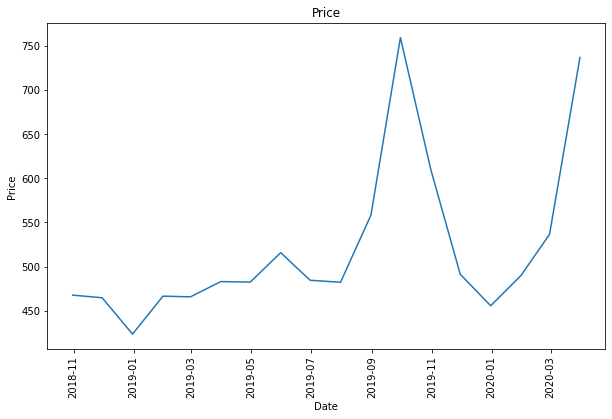

In [15]:
x = monthly_price['edate']
y = monthly_price['price_last']

# Create the figure with the desired size
plt.figure(figsize=(10, 6))

# Plot the data
plt.plot(x, y)

# Add title and axis labels
plt.title('Price')
plt.xlabel('Date')
plt.ylabel('Price')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Display the plot
plt.show()

In [16]:
Zoopla_2019=Zoopla_2019.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])
Zoopla_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1273935 entries, 0 to 1273934
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   property_id     1273935 non-null  int64  
 1   property_type   1149821 non-null  object 
 2   lon             1273935 non-null  float64
 3   lat             1273935 non-null  float64
 4   price_last      1273935 non-null  int64  
 5   num_bed_last    1273935 non-null  int64  
 6   num_bath_max    1273935 non-null  int64  
 7   description     1273683 non-null  object 
 8   end_date_new    1273935 non-null  object 
 9   start_date_new  1273935 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 97.2+ MB


In [17]:
Zoopla_2020=Zoopla_2020.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])
Zoopla_2021=Zoopla_2021.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])
Zoopla_2022=Zoopla_2022.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])

In [18]:
Zoopla_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1263006 entries, 0 to 1263005
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   property_id     1263006 non-null  int64  
 1   property_type   1168926 non-null  object 
 2   lon             1263006 non-null  float64
 3   lat             1263006 non-null  float64
 4   price_last      1263006 non-null  int64  
 5   num_bed_last    1263006 non-null  int64  
 6   num_bath_max    1263006 non-null  int64  
 7   description     1262701 non-null  object 
 8   end_date_new    1263006 non-null  object 
 9   start_date_new  1263006 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 96.4+ MB


In [19]:
Zoopla_2021.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 457212 entries, 0 to 457211
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   property_id     457212 non-null  int64  
 1   property_type   435404 non-null  object 
 2   lon             457212 non-null  float64
 3   lat             457212 non-null  float64
 4   price_last      457212 non-null  int64  
 5   num_bed_last    457212 non-null  int64  
 6   num_bath_max    457212 non-null  int64  
 7   description     457088 non-null  object 
 8   end_date_new    457212 non-null  object 
 9   start_date_new  457212 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 34.9+ MB


In [20]:
Zoopla_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307563 entries, 0 to 307562
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   property_id     307563 non-null  int64  
 1   property_type   292638 non-null  object 
 2   lon             307563 non-null  float64
 3   lat             307563 non-null  float64
 4   price_last      307563 non-null  int64  
 5   num_bed_last    307563 non-null  int64  
 6   num_bath_max    307563 non-null  int64  
 7   description     307475 non-null  object 
 8   end_date_new    307563 non-null  object 
 9   start_date_new  307563 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 23.5+ MB


In [21]:
Zoopla_2019['edate']=pd.to_datetime(Zoopla_2019['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [22]:
Zoopla_2020['edate']=pd.to_datetime(Zoopla_2020['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_2021['edate']=pd.to_datetime(Zoopla_2021['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_2022['edate']=pd.to_datetime(Zoopla_2022['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [23]:
Zoopla_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1273935 entries, 0 to 1273934
Data columns (total 11 columns):
 #   Column          Non-Null Count    Dtype         
---  ------          --------------    -----         
 0   property_id     1273935 non-null  int64         
 1   property_type   1149821 non-null  object        
 2   lon             1273935 non-null  float64       
 3   lat             1273935 non-null  float64       
 4   price_last      1273935 non-null  int64         
 5   num_bed_last    1273935 non-null  int64         
 6   num_bath_max    1273935 non-null  int64         
 7   description     1273683 non-null  object        
 8   end_date_new    1273935 non-null  object        
 9   start_date_new  1273935 non-null  object        
 10  edate           1273935 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2), int64(4), object(4)
memory usage: 106.9+ MB


In [24]:
date1=pd.to_datetime('2019-10-01')
z2019n =Zoopla_2019[~(Zoopla_2019['edate']>=date1)]
z2019n.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 824505 entries, 0 to 1273933
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   property_id     824505 non-null  int64         
 1   property_type   746739 non-null  object        
 2   lon             824505 non-null  float64       
 3   lat             824505 non-null  float64       
 4   price_last      824505 non-null  int64         
 5   num_bed_last    824505 non-null  int64         
 6   num_bath_max    824505 non-null  int64         
 7   description     824343 non-null  object        
 8   end_date_new    824505 non-null  object        
 9   start_date_new  824505 non-null  object        
 10  edate           824505 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2), int64(4), object(4)
memory usage: 75.5+ MB


In [25]:
date2=pd.to_datetime('2020-10-01')
z2020n =Zoopla_2020[~(Zoopla_2020['edate']>=date2)]
z2020n.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 721414 entries, 1 to 1263003
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   property_id     721414 non-null  int64         
 1   property_type   661317 non-null  object        
 2   lon             721414 non-null  float64       
 3   lat             721414 non-null  float64       
 4   price_last      721414 non-null  int64         
 5   num_bed_last    721414 non-null  int64         
 6   num_bath_max    721414 non-null  int64         
 7   description     721253 non-null  object        
 8   end_date_new    721414 non-null  object        
 9   start_date_new  721414 non-null  object        
 10  edate           721414 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2), int64(4), object(4)
memory usage: 66.0+ MB


In [26]:
date3=pd.to_datetime('2021-10-01')
z2021n =Zoopla_2021[~(Zoopla_2021['edate']>=date3)]
z2021n.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 340267 entries, 0 to 457211
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   property_id     340267 non-null  int64         
 1   property_type   324374 non-null  object        
 2   lon             340267 non-null  float64       
 3   lat             340267 non-null  float64       
 4   price_last      340267 non-null  int64         
 5   num_bed_last    340267 non-null  int64         
 6   num_bath_max    340267 non-null  int64         
 7   description     340180 non-null  object        
 8   end_date_new    340267 non-null  object        
 9   start_date_new  340267 non-null  object        
 10  edate           340267 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2), int64(4), object(4)
memory usage: 31.2+ MB


In [37]:
weekly19=z2019n.groupby('edate').property_id.agg(Count='count').reset_index()
weekly19

,edate,Count
0,2018-10-01,1746
1,2018-10-02,1700
2,2018-10-03,1643
3,2018-10-04,1629
4,2018-10-05,1607
...,...,...
342,2019-09-26,2366
343,2019-09-27,2704
344,2019-09-28,1386
345,2019-09-29,731


In [28]:
Zoopla_2019_2=z2019n.copy()

Zoopla_2019_2.set_index('edate',inplace=True)

monthly_price19=Zoopla_2019_2.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()
monthly_price19

,edate,price_last
0,2018-10-31,467.562509
1,2018-11-30,464.604006
2,2018-12-31,423.421575
3,2019-01-31,466.411019
4,2019-02-28,465.630371
5,2019-03-31,482.942973
6,2019-04-30,482.360825
7,2019-05-31,515.695093
8,2019-06-30,484.420719
9,2019-07-31,482.175142


In [29]:
weekly20=z2020n.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly20

,end_date_new,Count
0,2019-10-01,1608
1,2019-10-02,1466
2,2019-10-03,1487
3,2019-10-04,1972
4,2019-10-05,6
...,...,...
353,2020-09-26,1148
354,2020-09-27,404
355,2020-09-28,3123
356,2020-09-29,3688


In [30]:
weekly21=z2021n.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly21

,end_date_new,Count
0,2020-10-01,1168
1,2020-10-02,1097
2,2020-10-03,402
3,2020-10-04,107
4,2020-10-05,1392
...,...,...
337,2021-09-26,1973
338,2021-09-27,28
339,2021-09-28,505
340,2021-09-29,605


In [31]:
date_to_delete = '2023-03-31'
z2022n = Zoopla_2022[Zoopla_2022['edate']!=date_to_delete]
z2022n.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292671 entries, 0 to 307549
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   property_id     292671 non-null  int64         
 1   property_type   278563 non-null  object        
 2   lon             292671 non-null  float64       
 3   lat             292671 non-null  float64       
 4   price_last      292671 non-null  int64         
 5   num_bed_last    292671 non-null  int64         
 6   num_bath_max    292671 non-null  int64         
 7   description     292590 non-null  object        
 8   end_date_new    292671 non-null  object        
 9   start_date_new  292671 non-null  object        
 10  edate           292671 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2), int64(4), object(4)
memory usage: 26.8+ MB


In [32]:
weekly22=z2022n.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly22

,end_date_new,Count
0,2021-10-01,31
1,2021-10-02,282
2,2021-10-03,58
3,2021-10-04,1102
4,2021-10-05,1120
...,...,...
528,2023-03-26,61
529,2023-03-27,700
530,2023-03-28,674
531,2023-03-29,717


In [33]:
Zoopla=pd.concat([z2019n,z2020n,z2021n,z2022n])

In [62]:
Zoopla.to_csv('Zoopla_0808.csv')

### delet dupilicated

In [40]:
Zoopla=pd.read_csv('Zoopla_0808.csv')

In [41]:
Zoopla.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178857 entries, 0 to 2178856
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Unnamed: 0      int64  
 1   property_id     int64  
 2   property_type   object 
 3   lon             float64
 4   lat             float64
 5   price_last      int64  
 6   num_bed_last    int64  
 7   num_bath_max    int64  
 8   description     object 
 9   end_date_new    object 
 10  start_date_new  object 
 11  edate           object 
dtypes: float64(2), int64(5), object(5)
memory usage: 199.5+ MB


In [42]:
Zoopla = Zoopla.drop(columns='Unnamed: 0')

In [43]:
Zoopla['sdate']=pd.to_datetime(Zoopla['start_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla['edate']=pd.to_datetime(Zoopla['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla['duration']=Zoopla['edate']-Zoopla['sdate']

In [44]:
Zoopla.head()

,property_id,property_type,lon,lat,price_last,num_bed_last,num_bath_max,description,end_date_new,start_date_new,edate,sdate,duration
0,2523621,Flat,536725.010944,169747.042913,208,1,1,Immaculate one bedroom unfurnished maisonette ...,2018-10-02,2018-10-01,2018-10-02,2018-10-01,1 days
1,2503728,Detached house,542850.034432,166149.002135,462,4,3,This stunning detached house is a hidden gem j...,2019-07-29,2019-07-27,2019-07-29,2019-07-27,2 days
2,2522988,Flat,535705.023078,169333.218073,230,1,1,Beautiful ground floor flat with sole use of...,2019-09-30,2019-09-18,2019-09-30,2019-09-18,12 days
3,2504493,Maisonette,540299.988014,167488.258268,276,2,1,Available October 2018 - unfurnishedForming pa...,2018-10-27,2018-10-01,2018-10-27,2018-10-01,26 days
4,2510577,Flat,537037.964208,169980.228751,242,1,0,A very well presented 1 bedroom 1st floor flat...,2019-08-09,2019-07-19,2019-08-09,2019-07-19,21 days


In [45]:
date5=pd.to_datetime('2018-12-31')
date6=pd.to_datetime('2023-01-01')

In [46]:
date5

Timestamp('2018-12-31 00:00:00')

In [47]:
Zoopla_1 = Zoopla[Zoopla['edate'] > date5]

In [48]:
Zoopla_1 = Zoopla_1[Zoopla_1['edate'] < date6]

In [49]:
Zoopla_1.head()

,property_id,property_type,lon,lat,price_last,num_bed_last,num_bath_max,description,end_date_new,start_date_new,edate,sdate,duration
1,2503728,Detached house,542850.034432,166149.002135,462,4,3,This stunning detached house is a hidden gem j...,2019-07-29,2019-07-27,2019-07-29,2019-07-27,2 days
2,2522988,Flat,535705.023078,169333.218073,230,1,1,Beautiful ground floor flat with sole use of...,2019-09-30,2019-09-18,2019-09-30,2019-09-18,12 days
4,2510577,Flat,537037.964208,169980.228751,242,1,0,A very well presented 1 bedroom 1st floor flat...,2019-08-09,2019-07-19,2019-08-09,2019-07-19,21 days
6,2539228,Flat,544794.994108,166849.921219,288,2,1,Spacious & well presented 2 bed 1st floor fl...,2019-08-06,2019-08-01,2019-08-06,2019-08-01,5 days
7,2518162,Flat,536344.001598,168066.978653,277,2,1,Property Reference: 500143.First rate two bedr...,2019-03-17,2019-01-28,2019-03-17,2019-01-28,48 days


In [50]:

Zoopla_1.set_index('edate',inplace=True)

monthly_price_all=Zoopla_1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [51]:
yearly_count1 = Zoopla_1.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count1

,edate,property_id
0,2019-12-31,823223
1,2020-12-31,651995
2,2021-12-31,311135
3,2022-12-31,199007


In [52]:
monthly_price_all

,edate,price_last
0,2019-01-31,466.411019
1,2019-02-28,465.630371
2,2019-03-31,482.942973
3,2019-04-30,482.360825
4,2019-05-31,515.695093
5,2019-06-30,484.420719
6,2019-07-31,482.175142
7,2019-08-31,558.347856
8,2019-09-30,759.439276
9,2019-10-31,598.888717


In [53]:
zoopla2=Zoopla_1.copy()

In [54]:
zoopla2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1985360 entries, 2019-07-29 to 2022-12-23
Data columns (total 12 columns):
 #   Column          Dtype          
---  ------          -----          
 0   property_id     int64          
 1   property_type   object         
 2   lon             float64        
 3   lat             float64        
 4   price_last      int64          
 5   num_bed_last    int64          
 6   num_bath_max    int64          
 7   description     object         
 8   end_date_new    object         
 9   start_date_new  object         
 10  sdate           datetime64[ns] 
 11  duration        timedelta64[ns]
dtypes: datetime64[ns](1), float64(2), int64(4), object(4), timedelta64[ns](1)
memory usage: 196.9+ MB


In [55]:
zoopla2['duration_1']=zoopla2['duration'].dt.days

In [56]:
print(f"Zoopla has {zoopla2.shape[0]:,.0f} rows.")

print(f"The range of duration is {zoopla2.duration_1.min():,.2f} to {zoopla2.duration_1.max():,.2f}")

Zoopla has 1,985,360 rows.
The range of duration is 0.00 to 454.00


<AxesSubplot:ylabel='Frequency'>

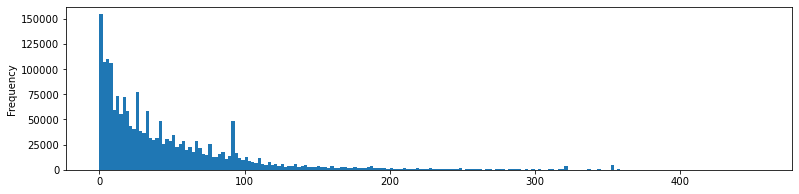

In [57]:
zoopla2.duration_1.plot.hist(bins=200, figsize=(13,3))

In [58]:
zoopla2.head()

,property_id,property_type,lon,lat,price_last,num_bed_last,num_bath_max,description,end_date_new,start_date_new,sdate,duration,duration_1
edate,,,,,,,,,,,,,
2019-07-29,2503728,Detached house,542850.034432,166149.002135,462,4,3,This stunning detached house is a hidden gem j...,2019-07-29,2019-07-27,2019-07-27,2 days,2
2019-09-30,2522988,Flat,535705.023078,169333.218073,230,1,1,Beautiful ground floor flat with sole use of...,2019-09-30,2019-09-18,2019-09-18,12 days,12
2019-08-09,2510577,Flat,537037.964208,169980.228751,242,1,0,A very well presented 1 bedroom 1st floor flat...,2019-08-09,2019-07-19,2019-07-19,21 days,21
2019-08-06,2539228,Flat,544794.994108,166849.921219,288,2,1,Spacious & well presented 2 bed 1st floor fl...,2019-08-06,2019-08-01,2019-08-01,5 days,5
2019-03-17,2518162,Flat,536344.001598,168066.978653,277,2,1,Property Reference: 500143.First rate two bedr...,2019-03-17,2019-01-28,2019-01-28,48 days,48


In [59]:
zoopla2.duration_1.describe()

count    1.985360e+06
mean     4.687286e+01
std      5.400950e+01
min      0.000000e+00
25%      1.000000e+01
50%      2.900000e+01
75%      6.600000e+01
max      4.540000e+02
Name: duration_1, dtype: float64

In [60]:
p1= zoopla2.duration_1.quantile(0.1)

Zoopla_2= zoopla2[zoopla2['duration_1'] >= p1]

In [61]:
p1

3.0

In [62]:
print(f"Zoopla has {Zoopla_2.shape[0]:,.0f} rows.")

print(f"The range of duration is {Zoopla_2.duration_1.min():,.2f} to {Zoopla_2.duration_1.max():,.2f}")

Zoopla has 1,831,141 rows.
The range of duration is 3.00 to 454.00


In [63]:
Zoopla_3=Zoopla_2.copy()

monthly_price_all_1=Zoopla_3.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [64]:
Zoopla_3.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1831141 entries, 2019-09-30 to 2022-12-29
Data columns (total 13 columns):
 #   Column          Dtype          
---  ------          -----          
 0   property_id     int64          
 1   property_type   object         
 2   lon             float64        
 3   lat             float64        
 4   price_last      int64          
 5   num_bed_last    int64          
 6   num_bath_max    int64          
 7   description     object         
 8   end_date_new    object         
 9   start_date_new  object         
 10  sdate           datetime64[ns] 
 11  duration        timedelta64[ns]
 12  duration_1      int64          
dtypes: datetime64[ns](1), float64(2), int64(5), object(4), timedelta64[ns](1)
memory usage: 195.6+ MB


In [65]:
yearly_count2 = Zoopla_3.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count2

,edate,property_id
0,2019-12-31,776559
1,2020-12-31,611471
2,2021-12-31,277145
3,2022-12-31,165966


In [66]:
Zoopla_test = Zoopla_3[['property_id','start_date_new','price_last']]


In [67]:
print(Zoopla_test)

            property_id start_date_new  price_last
edate                                             
2019-09-30      2522988     2019-09-18         230
2019-08-09      2510577     2019-07-19         242
2019-08-06      2539228     2019-08-01         288
2019-03-17      2518162     2019-01-28         277
2019-06-26      2480679     2019-05-25         335
...                 ...            ...         ...
2022-12-21     25460219     2022-12-07        1154
2022-12-14     25469771     2022-12-08         525
2022-12-14     25464358     2022-12-08         795
2022-12-22     25468063     2022-12-18         438
2022-12-29     25456092     2022-12-20         475

[1831141 rows x 3 columns]


In [68]:
Zoopla_test_1 = Zoopla_test.groupby(['property_id', 'start_date_new'])['price_last'].max().reset_index()

In [69]:
Zoopla_test_3 = Zoopla_3.drop_duplicates(subset=['property_id','start_date_new'],keep='first')

In [70]:
Zoopla_test_3.head()

,property_id,property_type,lon,lat,price_last,num_bed_last,num_bath_max,description,end_date_new,start_date_new,sdate,duration,duration_1
edate,,,,,,,,,,,,,
2019-09-30,2522988,Flat,535705.023078,169333.218073,230,1,1,Beautiful ground floor flat with sole use of...,2019-09-30,2019-09-18,2019-09-18,12 days,12
2019-08-09,2510577,Flat,537037.964208,169980.228751,242,1,0,A very well presented 1 bedroom 1st floor flat...,2019-08-09,2019-07-19,2019-07-19,21 days,21
2019-08-06,2539228,Flat,544794.994108,166849.921219,288,2,1,Spacious & well presented 2 bed 1st floor fl...,2019-08-06,2019-08-01,2019-08-01,5 days,5
2019-03-17,2518162,Flat,536344.001598,168066.978653,277,2,1,Property Reference: 500143.First rate two bedr...,2019-03-17,2019-01-28,2019-01-28,48 days,48
2019-06-26,2480679,NaN,539177.025054,170457.023585,335,3,1,We are pleased to present this charming three ...,2019-06-26,2019-05-25,2019-05-25,32 days,32


In [71]:
Zoopla_test_3.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 897923 entries, 2019-09-30 to 2022-12-29
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     897923 non-null  int64          
 1   property_type   847242 non-null  object         
 2   lon             897923 non-null  float64        
 3   lat             897923 non-null  float64        
 4   price_last      897923 non-null  int64          
 5   num_bed_last    897923 non-null  int64          
 6   num_bath_max    897923 non-null  int64          
 7   description     897694 non-null  object         
 8   end_date_new    897923 non-null  object         
 9   start_date_new  897923 non-null  object         
 10  sdate           897923 non-null  datetime64[ns] 
 11  duration        897923 non-null  timedelta64[ns]
 12  duration_1      897923 non-null  int64          
dtypes: datetime64[ns](1), float64(2), int64(5), object(4), tim

In [72]:
Zoopla_test_2 = Zoopla_test_1.merge(Zoopla_test_3, on=['property_id','start_date_new'], how='left')

##,'price_last'

In [73]:
Zoopla_test_2.head()

,property_id,start_date_new,price_last_x,property_type,lon,lat,price_last_y,num_bed_last,num_bath_max,description,end_date_new,sdate,duration,duration_1
0,281626,2019-10-16,462,Terraced house,539014.887884,183707.192705,462,3,0,Spacious 3 bedroom house with contemporary des...,2019-10-22,2019-10-16,6 days,6
1,578819,2021-02-06,945,Flat,533106.644418,180644.485038,945,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-06,13 days,13
2,578819,2021-02-13,945,Flat,533061.980622,180653.108108,945,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-13,6 days,6
3,652324,2019-01-08,185,Studio,524948.014150,190272.767028,185,0,1,A brand new first floor Studio flat with easy ...,2019-04-03,2019-01-08,85 days,85
4,652324,2019-03-14,185,Studio,524948.014150,190272.767028,185,0,1,A brand new first floor studio apartment sit...,2019-04-01,2019-03-14,18 days,18


In [74]:
Zoopla_test_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 897923 entries, 0 to 897922
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     897923 non-null  int64          
 1   start_date_new  897923 non-null  object         
 2   price_last_x    897923 non-null  int64          
 3   property_type   847242 non-null  object         
 4   lon             897923 non-null  float64        
 5   lat             897923 non-null  float64        
 6   price_last_y    897923 non-null  int64          
 7   num_bed_last    897923 non-null  int64          
 8   num_bath_max    897923 non-null  int64          
 9   description     897694 non-null  object         
 10  end_date_new    897923 non-null  object         
 11  sdate           897923 non-null  datetime64[ns] 
 12  duration        897923 non-null  timedelta64[ns]
 13  duration_1      897923 non-null  int64          
dtypes: datetime64[ns](1)

In [75]:
Zoopla_test_2=Zoopla_test_2.drop(columns=['price_last_y'])

In [76]:
Zoopla_test_2 = Zoopla_test_2.rename(columns={'price_last_x': 'price_last'})

In [77]:
Zoopla_test_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 897923 entries, 0 to 897922
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     897923 non-null  int64          
 1   start_date_new  897923 non-null  object         
 2   price_last      897923 non-null  int64          
 3   property_type   847242 non-null  object         
 4   lon             897923 non-null  float64        
 5   lat             897923 non-null  float64        
 6   num_bed_last    897923 non-null  int64          
 7   num_bath_max    897923 non-null  int64          
 8   description     897694 non-null  object         
 9   end_date_new    897923 non-null  object         
 10  sdate           897923 non-null  datetime64[ns] 
 11  duration        897923 non-null  timedelta64[ns]
 12  duration_1      897923 non-null  int64          
dtypes: datetime64[ns](1), float64(2), int64(5), object(4), timedelta64[ns](1)


In [78]:
# Zoopla_test_5 = Zoopla_test_2.drop_duplicates(subset=['property_id','price_last'],keep='first')

In [79]:
#Zoopla_4=Zoopla_test_5.copy()
Zoopla_4=Zoopla_test_2.copy()
Zoopla_4['edate']=pd.to_datetime(Zoopla_4['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_4.set_index('edate',inplace=True)

monthly_price=Zoopla_4.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [80]:
yearly_count3 = Zoopla_4.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count3

,edate,property_id
0,2019-12-31,252156
1,2020-12-31,239824
2,2021-12-31,252319
3,2022-12-31,153624


In [81]:
#Zoopla_test_6=Zoopla_test_5.dropna()
Zoopla_test_6=Zoopla_test_2.dropna()

In [82]:
Zoopla_5=Zoopla_test_6.copy()
Zoopla_5['edate']=pd.to_datetime(Zoopla_5['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_5.set_index('edate',inplace=True)



In [83]:
monthly_price_dropna=Zoopla_5.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [84]:
Zoopla_5.head()

,property_id,start_date_new,price_last,property_type,lon,lat,num_bed_last,num_bath_max,description,end_date_new,sdate,duration,duration_1
edate,,,,,,,,,,,,,
2019-10-22,281626,2019-10-16,462,Terraced house,539014.887884,183707.192705,3,0,Spacious 3 bedroom house with contemporary des...,2019-10-22,2019-10-16,6 days,6
2021-02-19,578819,2021-02-06,945,Flat,533106.644418,180644.485038,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-06,13 days,13
2021-02-19,578819,2021-02-13,945,Flat,533061.980622,180653.108108,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-13,6 days,6
2019-04-03,652324,2019-01-08,185,Studio,524948.014150,190272.767028,0,1,A brand new first floor Studio flat with easy ...,2019-04-03,2019-01-08,85 days,85
2019-04-01,652324,2019-03-14,185,Studio,524948.014150,190272.767028,0,1,A brand new first floor studio apartment sit...,2019-04-01,2019-03-14,18 days,18


In [85]:
yearly_count4 =Zoopla_5.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count4

,edate,property_id
0,2019-12-31,235075
1,2020-12-31,226262
2,2021-12-31,239798
3,2022-12-31,145915


### delet outliers

In [86]:
print(f"Zoopla has {Zoopla_5.shape[0]:,.0f} rows.")

print(f"The range of price is {Zoopla_5.price_last.min():,.2f} to {Zoopla_5.price_last.max():,.2f}")
print(f"The range of bedroom numer is {Zoopla_5.num_bed_last.min():,.2f} to {Zoopla_5.num_bed_last.max():,.2f}")
print(f"The range of bathroom numer is {Zoopla_5.num_bath_max.min():,.2f} to {Zoopla_5.num_bath_max.max():,.2f}")

Zoopla has 847,050 rows.
The range of price is 0.00 to 79,846.00
The range of bedroom numer is 0.00 to 255.00
The range of bathroom numer is 0.00 to 186.00


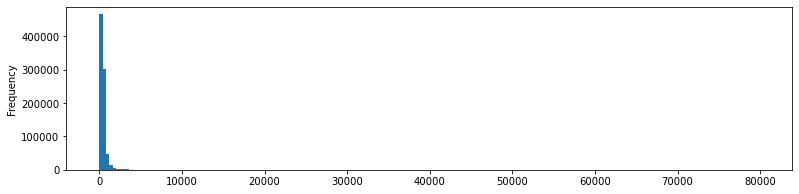

In [87]:
Zoopla_5.price_last.plot.hist(bins=200, figsize=(13,3))
plt.savefig('hist1.png', dpi=300, bbox_inches='tight')

(0.0, 2500.0)

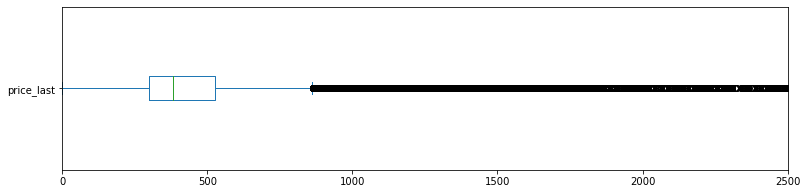

In [88]:
ax = Zoopla_5.price_last.plot.box(vert=False, figsize=(13,3))
ax.set_xlim(0,2500)

In [89]:
Zoopla_5.price_last.describe()

count    847050.000000
mean        491.062482
std         669.828026
min           0.000000
25%         300.000000
50%         381.000000
75%         525.000000
max       79846.000000
Name: price_last, dtype: float64

In [90]:
Zoopla_5['lnprice'] = np.log(Zoopla_5.price_last)

C:\Program Files\Anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [91]:
Zoopla_6 = Zoopla_5.copy()

In [92]:
q1 = Zoopla_6.lnprice.quantile(0.25)
q3 = Zoopla_6.lnprice.quantile(0.75)
iqr = q3 - q1
Zoopla_6 = Zoopla_6[(Zoopla_6['lnprice'] >= q1 - 2 * iqr) & (Zoopla_6['lnprice'] <= q3 + 2 * iqr)]

In [93]:
Zoopla_6.price_last.describe()

count    829511.000000
mean        437.884572
std         229.630690
min          98.000000
25%         299.000000
50%         375.000000
75%         508.000000
max        1606.000000
Name: price_last, dtype: float64

In [94]:
Zoopla_6.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829511 entries, 2019-10-22 to 2022-11-14
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     829511 non-null  int64          
 1   start_date_new  829511 non-null  object         
 2   price_last      829511 non-null  int64          
 3   property_type   829511 non-null  object         
 4   lon             829511 non-null  float64        
 5   lat             829511 non-null  float64        
 6   num_bed_last    829511 non-null  int64          
 7   num_bath_max    829511 non-null  int64          
 8   description     829511 non-null  object         
 9   end_date_new    829511 non-null  object         
 10  sdate           829511 non-null  datetime64[ns] 
 11  duration        829511 non-null  timedelta64[ns]
 12  duration_1      829511 non-null  int64          
 13  lnprice         829511 non-null  float64        
dtypes: d

In [95]:
Zoopla_7=Zoopla_6.copy()
Zoopla_7['edate']=pd.to_datetime(Zoopla_7['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_7.set_index('edate',inplace=True)

monthly_price_drop_outliers=Zoopla_7.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [96]:
yearly_count5 =Zoopla_7.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count5

,edate,property_id
0,2019-12-31,230435
1,2020-12-31,222165
2,2021-12-31,235866
3,2022-12-31,141045


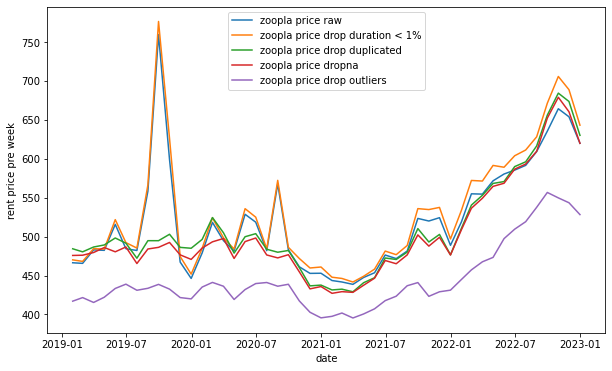

In [97]:
fig,ax=plt.subplots(figsize=(10,6))

ax.set_xlabel("date")
ax.set_ylabel("rent price pre week")
#ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price_all_1['edate'], monthly_price_all_1.price_last,label='zoopla price drop short duration')
ax.plot(monthly_price['edate'], monthly_price.price_last,label='zoopla price drop duplicated')
ax.plot(monthly_price_dropna['edate'],monthly_price_dropna.price_last,label='zoopla price dropna')
ax.plot(monthly_price_drop_outliers['edate'], monthly_price_drop_outliers.price_last,label='zoopla price drop outliers')
plt.legend()
plt.savefig('Rent price.png', dpi=300, bbox_inches='tight')
plt.show()

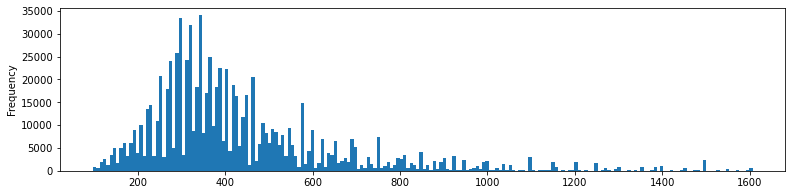

In [98]:
Zoopla_6.price_last.plot.hist(bins=200, figsize=(13,3))
plt.savefig('hist2.png', dpi=300, bbox_inches='tight')

<AxesSubplot:ylabel='Frequency'>

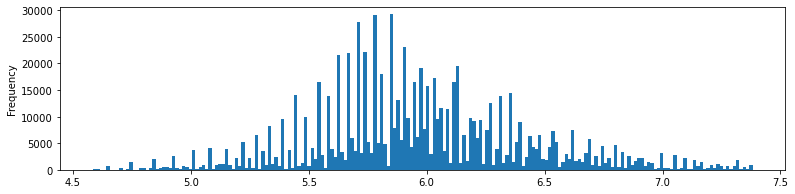

In [99]:
Zoopla_6.lnprice.plot.hist(bins=200,figsize=(13,3))

In [100]:
Zoopla_6.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829511 entries, 2019-10-22 to 2022-11-14
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     829511 non-null  int64          
 1   start_date_new  829511 non-null  object         
 2   price_last      829511 non-null  int64          
 3   property_type   829511 non-null  object         
 4   lon             829511 non-null  float64        
 5   lat             829511 non-null  float64        
 6   num_bed_last    829511 non-null  int64          
 7   num_bath_max    829511 non-null  int64          
 8   description     829511 non-null  object         
 9   end_date_new    829511 non-null  object         
 10  sdate           829511 non-null  datetime64[ns] 
 11  duration        829511 non-null  timedelta64[ns]
 12  duration_1      829511 non-null  int64          
 13  lnprice         829511 non-null  float64        
dtypes: d

### add covid info

In [101]:
t1 = pd.to_datetime('2020-03-16')
t2 = pd.to_datetime('2021-02-22')
t3 = pd.to_datetime('2022-02-24')
# Create boolean masks for 'post', 'pre', and 'during' periods
Zoopla_6['edate']=pd.to_datetime(Zoopla_6['end_date_new'],format='%Y-%m-%d',errors='coerce')

pre_mask = Zoopla_6['edate'] < t1

during_mask = (Zoopla_6['edate'] >= t1) & (Zoopla_6['edate'] <= t2)

post_mask = Zoopla_6['edate'] > t2
post1_mask = (Zoopla_6['edate'] > t2) & (Zoopla_6['edate'] <= t3)
post2_mask = Zoopla_6['edate'] > t3

# Assign 0 or 1 based on the boolean masks to new columns 'post', 'pre', and 'during'
Zoopla_6['pre'] = pre_mask.astype(int)
Zoopla_6['during'] = during_mask.astype(int)
Zoopla_6['post'] = post_mask.astype(int)
Zoopla_6['post1'] = post1_mask.astype(int)
Zoopla_6['post2'] = post2_mask.astype(int)

In [102]:
Zoopla_6.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829511 entries, 2019-10-22 to 2022-11-14
Data columns (total 20 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     829511 non-null  int64          
 1   start_date_new  829511 non-null  object         
 2   price_last      829511 non-null  int64          
 3   property_type   829511 non-null  object         
 4   lon             829511 non-null  float64        
 5   lat             829511 non-null  float64        
 6   num_bed_last    829511 non-null  int64          
 7   num_bath_max    829511 non-null  int64          
 8   description     829511 non-null  object         
 9   end_date_new    829511 non-null  object         
 10  sdate           829511 non-null  datetime64[ns] 
 11  duration        829511 non-null  timedelta64[ns]
 12  duration_1      829511 non-null  int64          
 13  lnprice         829511 non-null  float64        
 14  edat

In [103]:
Zoopla_6.head()

,property_id,start_date_new,price_last,property_type,lon,lat,num_bed_last,num_bath_max,description,end_date_new,sdate,duration,duration_1,lnprice,edate,pre,during,post,post1,post2
edate,,,,,,,,,,,,,,,,,,,,
2019-10-22,281626,2019-10-16,462,Terraced house,539014.887884,183707.192705,3,0,Spacious 3 bedroom house with contemporary des...,2019-10-22,2019-10-16,6 days,6,6.135565,2019-10-22,1,0,0,0,0
2021-02-19,578819,2021-02-06,945,Flat,533106.644418,180644.485038,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-06,13 days,13,6.851185,2021-02-19,0,1,0,0,0
2021-02-19,578819,2021-02-13,945,Flat,533061.980622,180653.108108,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-13,6 days,6,6.851185,2021-02-19,0,1,0,0,0
2019-04-03,652324,2019-01-08,185,Studio,524948.014150,190272.767028,0,1,A brand new first floor Studio flat with easy ...,2019-04-03,2019-01-08,85 days,85,5.220356,2019-04-03,1,0,0,0,0
2019-04-01,652324,2019-03-14,185,Studio,524948.014150,190272.767028,0,1,A brand new first floor studio apartment sit...,2019-04-01,2019-03-14,18 days,18,5.220356,2019-04-01,1,0,0,0,0


In [104]:
Zoopla_6=Zoopla_6.drop(columns=['duration','start_date_new','end_date_new'])

In [105]:
Zoopla_6.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829511 entries, 2019-10-22 to 2022-11-14
Data columns (total 17 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   property_id    829511 non-null  int64         
 1   price_last     829511 non-null  int64         
 2   property_type  829511 non-null  object        
 3   lon            829511 non-null  float64       
 4   lat            829511 non-null  float64       
 5   num_bed_last   829511 non-null  int64         
 6   num_bath_max   829511 non-null  int64         
 7   description    829511 non-null  object        
 8   sdate          829511 non-null  datetime64[ns]
 9   duration_1     829511 non-null  int64         
 10  lnprice        829511 non-null  float64       
 11  edate          829511 non-null  datetime64[ns]
 12  pre            829511 non-null  int32         
 13  during         829511 non-null  int32         
 14  post           829511 non-null  int3

In [106]:
Zoopla_6.head()

,property_id,price_last,property_type,lon,lat,num_bed_last,num_bath_max,description,sdate,duration_1,lnprice,edate,pre,during,post,post1,post2
edate,,,,,,,,,,,,,,,,,
2019-10-22,281626,462,Terraced house,539014.887884,183707.192705,3,0,Spacious 3 bedroom house with contemporary des...,2019-10-16,6,6.135565,2019-10-22,1,0,0,0,0
2021-02-19,578819,945,Flat,533106.644418,180644.485038,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-06,13,6.851185,2021-02-19,0,1,0,0,0
2021-02-19,578819,945,Flat,533061.980622,180653.108108,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-13,6,6.851185,2021-02-19,0,1,0,0,0
2019-04-03,652324,185,Studio,524948.014150,190272.767028,0,1,A brand new first floor Studio flat with easy ...,2019-01-08,85,5.220356,2019-04-03,1,0,0,0,0
2019-04-01,652324,185,Studio,524948.014150,190272.767028,0,1,A brand new first floor studio apartment sit...,2019-03-14,18,5.220356,2019-04-01,1,0,0,0,0


In [130]:
Zoopla_6.to_csv('Zoopla_6_0822.csv')

### price change in diff covid priod

In [107]:
pre = Zoopla_6[Zoopla_6['pre'] == 1]  # Filter the DataFrame based on the 'post' condition (where post is 1)
pre_description = pre['price_last'].describe()
print(pre_description)


count    270437.000000
mean        429.299619
std         228.861329
min          98.000000
25%         288.000000
50%         369.000000
75%         500.000000
max        1604.000000
Name: price_last, dtype: float64


In [108]:
during= Zoopla_6[Zoopla_6['during'] == 1]  # Filter the DataFrame based on the 'post' condition (where post is 1)
during_description = during['price_last'].describe()
print(during_description)


count    218931.000000
mean        422.918335
std         213.007144
min          98.000000
25%         294.000000
50%         369.000000
75%         495.000000
max        1604.000000
Name: price_last, dtype: float64


In [109]:
post = Zoopla_6[Zoopla_6['post'] == 1]  
post_description = post['price_last'].describe()
print(post_description)


count    340143.000000
mean        454.343126
std         239.318676
min          98.000000
25%         300.000000
50%         390.000000
75%         531.000000
max        1606.000000
Name: price_last, dtype: float64


In [110]:
post1 = Zoopla_6[Zoopla_6['post1'] == 1]  
post1_description = post1['price_last'].describe()
print(post1_description)

count    222309.000000
mean        421.802730
std         217.453532
min          98.000000
25%         288.000000
50%         368.000000
75%         485.000000
max        1606.000000
Name: price_last, dtype: float64


In [111]:
post2 = Zoopla_6[Zoopla_6['post2'] == 1]  
post2_description = post2['price_last'].describe()
print(post2_description)

count    117834.000000
mean        515.734771
std         265.235358
min          98.000000
25%         335.000000
50%         438.000000
75%         623.000000
max        1606.000000
Name: price_last, dtype: float64


## overall change

The computation of zoopla_join0822,boro_price and lsoa_price files is executed using R and saved under the filename 'join.Rmd'.

### prepare & overall line chart

In [112]:
zoopla_join = pd.read_csv('zoopla_join0822.csv')

In [113]:
zoopla_join.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829401 entries, 0 to 829400
Data columns (total 30 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   edate...1      829401 non-null  object 
 1   property_id    829401 non-null  int64  
 2   price_last     829401 non-null  int64  
 3   property_type  829401 non-null  object 
 4   num_bed_last   829401 non-null  int64  
 5   num_bath_max   829401 non-null  int64  
 6   description    829401 non-null  object 
 7   sdate          829401 non-null  object 
 8   duration_1     829401 non-null  int64  
 9   lnprice        829401 non-null  float64
 10  edate...11     829401 non-null  object 
 11  pre            829401 non-null  int64  
 12  during         829401 non-null  int64  
 13  post           829401 non-null  int64  
 14  post1          829401 non-null  int64  
 15  post2          829401 non-null  int64  
 16  LSOA11CD       829401 non-null  object 
 17  LSOA11NM       829401 non-nul

In [114]:
zoopla_join=zoopla_join.rename(columns={'sdate':'start_date_new','edate...11':'end_date_new'})

In [115]:
zoopla_join=zoopla_join.drop(columns=['edate...1','MSOA11CD','MSOA11NM','RGN11CD','RGN11NM','USUALRES','HHOLDRES','COMESTRES','POPDEN','HHOLDS','AVHHOLDSZ'])

In [116]:
zoopla_join.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829401 entries, 0 to 829400
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   property_id     829401 non-null  int64  
 1   price_last      829401 non-null  int64  
 2   property_type   829401 non-null  object 
 3   num_bed_last    829401 non-null  int64  
 4   num_bath_max    829401 non-null  int64  
 5   description     829401 non-null  object 
 6   start_date_new  829401 non-null  object 
 7   duration_1      829401 non-null  int64  
 8   lnprice         829401 non-null  float64
 9   end_date_new    829401 non-null  object 
 10  pre             829401 non-null  int64  
 11  during          829401 non-null  int64  
 12  post            829401 non-null  int64  
 13  post1           829401 non-null  int64  
 14  post2           829401 non-null  int64  
 15  LSOA11CD        829401 non-null  object 
 16  LSOA11NM        829401 non-null  object 
 17  LAD11CD   

In [117]:
def is_inner_london(borough_name):
    inner_london_boroughs = ['Camden','City of London','Hackney','Hammersmith and Fulham','Haringey','Islington',
                             'Kensington and Chelsea','Lambeth','Lewisham','Newham','Southwark','Tower Hamlets',
                             'Wandsworth','Westminster']  # 写入inner London的borough name
    return int(borough_name in inner_london_boroughs)

In [118]:
zoopla_join['inner_London'] = zoopla_join['LAD11NM'].apply(is_inner_london)

In [119]:
zoopla_join['edate']=pd.to_datetime(zoopla_join['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [120]:
inner = zoopla_join[zoopla_join['inner_London']==1]
outer = zoopla_join[zoopla_join['inner_London']==0]

In [121]:
inner1=inner.copy()

inner1.set_index('edate',inplace=True)

monthly_price_inner=inner1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [122]:
outer1=outer.copy()

outer1.set_index('edate',inplace=True)

monthly_price_outer=outer1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()


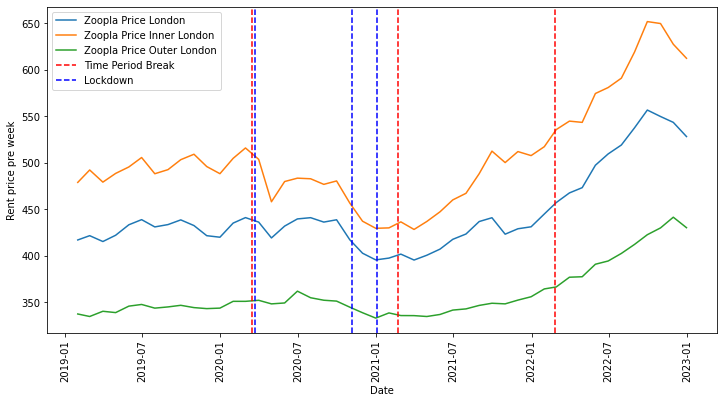

In [123]:
zoopla_join1=zoopla_join.copy()

zoopla_join1.set_index('edate',inplace=True)

monthly_price=zoopla_join1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()
fig,ax=plt.subplots(figsize=(12,6))
ax.set_xlabel("Date")
ax.set_ylabel("Rent price pre week")
#ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price['edate'], monthly_price.price_last,label='Zoopla Price London')
ax.plot(monthly_price_inner['edate'], monthly_price_inner.price_last,label='Zoopla Price Inner London')
ax.plot(monthly_price_outer['edate'], monthly_price_outer.price_last,label='Zoopla Price Outer London')
# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2021-02-22'), pd.to_datetime('2022-02-24')]
vertical_line_dates2 = [ pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]
#pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')
    
plt.axvline(x=pd.to_datetime('2020-03-16'), color='red', linestyle='--',label='Time Period Break')
# Plot the blue vertical lines
for date in vertical_line_dates2:
    plt.axvline(x=date, color='blue', linestyle='--')
plt.axvline(x=pd.to_datetime('2020-03-23'), color='blue', linestyle='--',label='Lockdown')
# Display the plot
plt.legend()

plt.savefig('Rent price pre week.png', dpi=300, bbox_inches='tight')
plt.show()


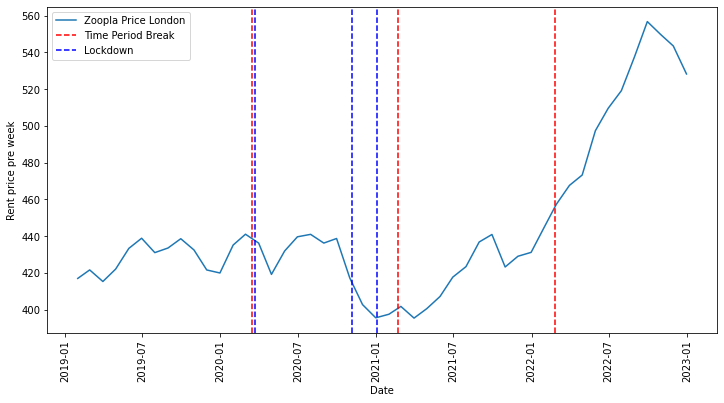

In [124]:

fig,ax=plt.subplots(figsize=(12,6))
ax.set_xlabel("Date")
ax.set_ylabel("Rent price pre week")
#ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price['edate'], monthly_price.price_last,label='Zoopla Price London')
# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2021-02-22'), pd.to_datetime('2022-02-24')]
vertical_line_dates2 = [ pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]
#pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')
    
plt.axvline(x=pd.to_datetime('2020-03-16'), color='red', linestyle='--',label='Time Period Break')
# Plot the blue vertical lines
for date in vertical_line_dates2:
    plt.axvline(x=date, color='blue', linestyle='--')
plt.axvline(x=pd.to_datetime('2020-03-23'), color='blue', linestyle='--',label='Lockdown')
# Display the plot
plt.legend()
plt.show()

In [125]:
monthly_count = zoopla_join1.groupby(pd.Grouper(freq='M')).property_id.count().reset_index()

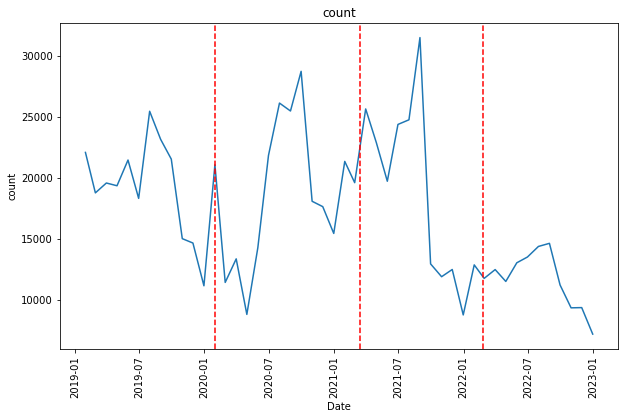

In [126]:
x = monthly_count['edate']
y = monthly_count['property_id']

# Create the figure with the desired size
plt.figure(figsize=(10, 6))

# Plot the data
plt.plot(x, y)

# Add title and axis labels
plt.title('count')
plt.xlabel('Date')
plt.ylabel('count')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2020-01-31'), pd.to_datetime('2021-03-16'), pd.to_datetime('2022-02-24')]
#vertical_line_dates2 = [pd.to_datetime('2020-03-23'), pd.to_datetime('2020-04-08'), pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')

# Plot the blue vertical lines
#for date in vertical_line_dates2:
    #plt.axvline(x=date, color='blue', linestyle='--')

# Display the plot
plt.show()

In [127]:
monthly_price['growth_rate'] = monthly_price['price_last'].pct_change() * 100
monthly_price

,edate,price_last,growth_rate
0,2019-01-31,417.069436,NaN
1,2019-02-28,421.684011,1.106429
2,2019-03-31,415.393009,-1.491876
3,2019-04-30,422.141151,1.624520
4,2019-05-31,433.398452,2.666715
5,2019-06-30,438.915870,1.273059
6,2019-07-31,431.097380,-1.781319
7,2019-08-31,433.605978,0.581910
8,2019-09-30,438.655813,1.164614
9,2019-10-31,432.546236,-1.392795


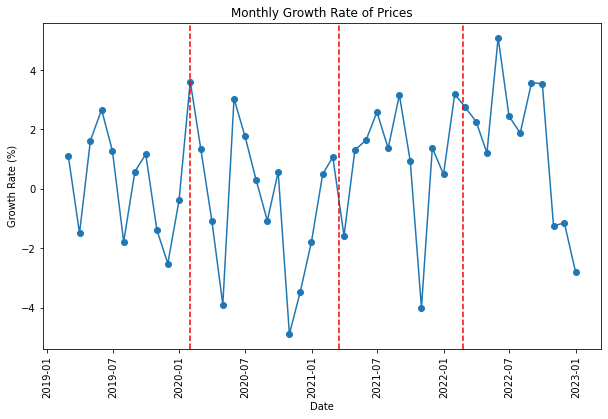

In [128]:
plt.figure(figsize=(10, 6))
plt.plot(monthly_price['edate'], monthly_price['growth_rate'], marker='o', linestyle='-')
plt.title('Monthly Growth Rate of Prices')
plt.xlabel('Date')
plt.ylabel('Growth Rate (%)')
plt.xticks(rotation='vertical')
# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2020-01-31'), pd.to_datetime('2021-03-16'), pd.to_datetime('2022-02-24')]
#vertical_line_dates2 = [pd.to_datetime('2020-03-23'), pd.to_datetime('2020-04-08'), pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')

# Plot the blue vertical lines
#for date in vertical_line_dates2:
    #plt.axvline(x=date, color='blue', linestyle='--')

# Display the plot
plt.show()

### boro change plt

In [1]:

from matplotlib.colors import ListedColormap
import contextily
import matplotlib.cm as cm
import matplotlib as mpl
import geopandas as gpd
import statsmodels.api as sm
import os
import matplotlib.colors as mcolors

<jemalloc>: MADV_DONTNEED does not work (memset will be used instead)
<jemalloc>: (This is the expected behaviour if you are running under QEMU)


In [3]:
current_dir = os.getcwd()
relative_path = 'london_lsoa_shp/LSOA_2011_London_gen_MHW.shp'
file_path = os.path.join(current_dir, relative_path)
lsoashp = gpd.read_file(file_path)

In [2]:
current_dir = os.getcwd()
relative_path = 'london_borough_shp/London_Borough_Excluding_MHW.shp'
file_path = os.path.join(current_dir, relative_path)
boros = gpd.read_file(file_path)

In [4]:
lsoashp=lsoashp.to_crs('epsg:27700')

In [3]:
boros=boros.to_crs('epsg:27700')

In [7]:
boros.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NAME        33 non-null     object  
 1   GSS_CODE    33 non-null     object  
 2   HECTARES    33 non-null     float64 
 3   NONLD_AREA  33 non-null     float64 
 4   ONS_INNER   33 non-null     object  
 5   SUB_2009    0 non-null      object  
 6   SUB_2006    0 non-null      object  
 7   geometry    33 non-null     geometry
dtypes: float64(2), geometry(1), object(5)
memory usage: 2.2+ KB


In [6]:
boro_price = pd.read_csv('boro_price.csv')

In [7]:
lsoa_price = pd.read_csv('lsoa_price.csv')

In [8]:
lsoa_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4826 entries, 0 to 4825
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         4826 non-null   int64  
 1   LSOA11NM           4826 non-null   object 
 2   lsoa_price         4826 non-null   float64
 3   pre_price          4818 non-null   float64
 4   during_price       4777 non-null   float64
 5   post_price         4818 non-null   float64
 6   post1_price        4807 non-null   float64
 7   post2_price        4786 non-null   float64
 8   diff_pre_during    4775 non-null   float64
 9   diff_during_post   4774 non-null   float64
 10  diff_during_post1  4765 non-null   float64
 11  diff_post1_post2   4775 non-null   float64
dtypes: float64(10), int64(1), object(1)
memory usage: 452.6+ KB


In [8]:
price_join = boros.merge(boro_price, left_on=['NAME'], right_on=['LAD11NM'],how='left')


In [10]:
price_lsoa_join = lsoashp.merge(lsoa_price, left_on=['LSOA11NM'], right_on=['LSOA11NM'],how='left')

#### boro

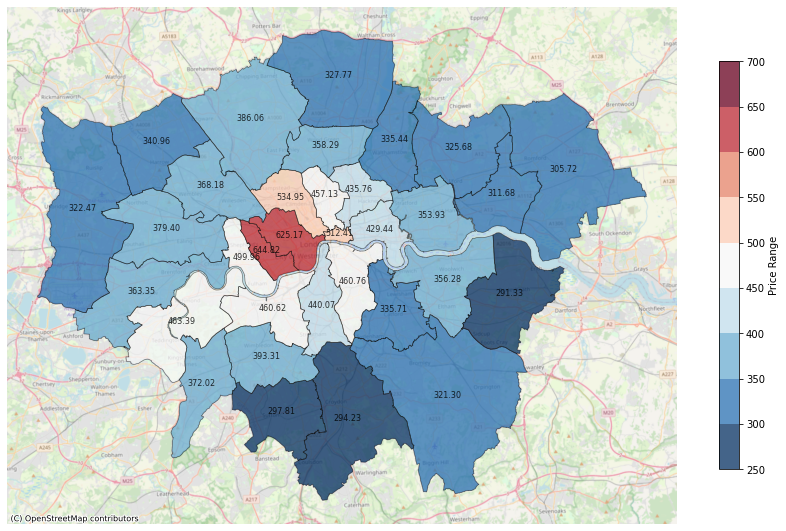

In [9]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='boro_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

# Plot the borough boundaries
for idx, row in price_join.iterrows():
    price = row['boro_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.8)  # Rounded to 2 decimal places


ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map1.png', dpi=300, bbox_inches='tight')

plt.show()


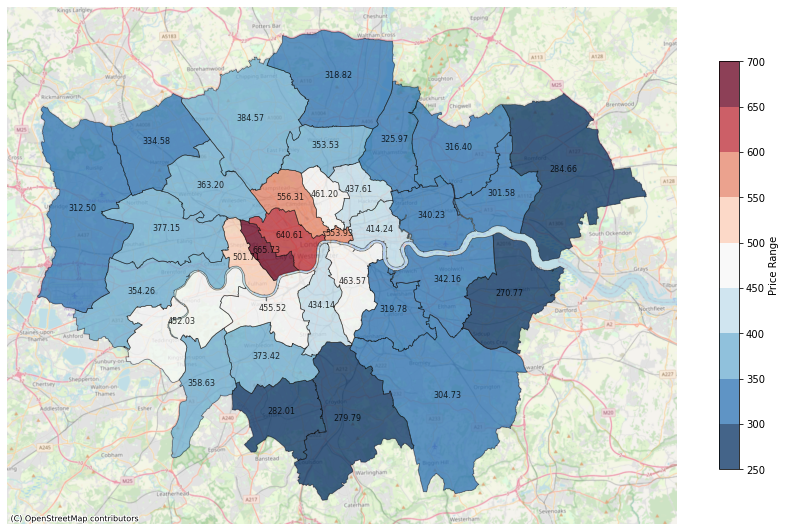

In [23]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='pre_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

for idx, row in price_join.iterrows():
    price = row['pre_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.8)  # Rounded to 2 decimal places

# Plot the borough boundaries

boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)


ax.set_axis_off()


# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map2.png', dpi=300, bbox_inches='tight')

plt.show()


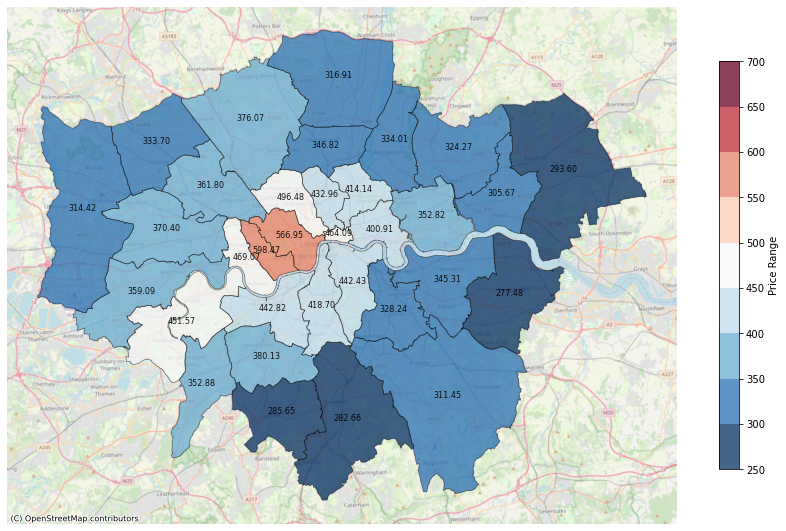

In [24]:

# Define the boundaries for the legend segments
#legend_bins = [200,300,400,500,600,700,800]
legend_bins = [250,300,350,400,450,500,550,600,650,700]
# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='during_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['during_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()


# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map3.png', dpi=300, bbox_inches='tight')

plt.show()


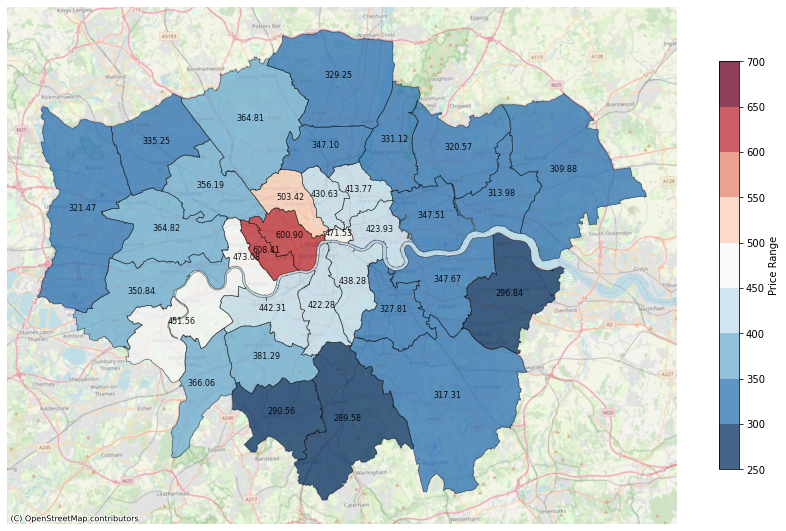

In [25]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='post1_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['post1_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.9)  # Rounded to 2 decimal places


# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map4.png', dpi=300, bbox_inches='tight')

plt.show()

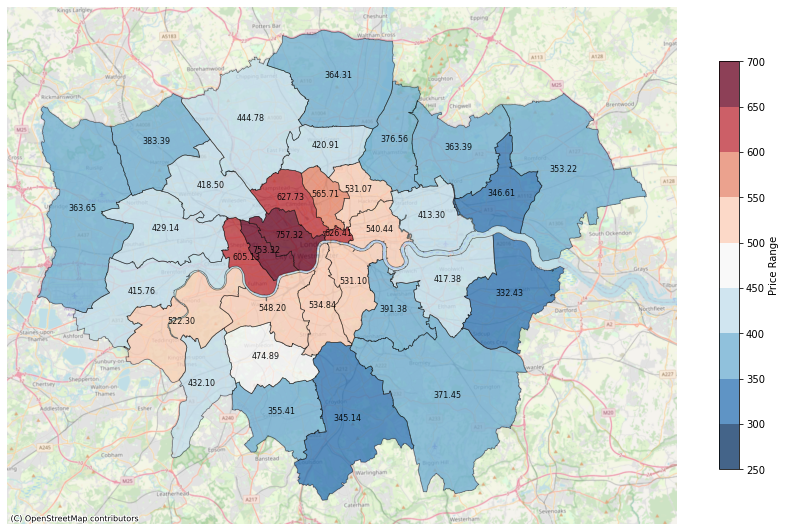

In [26]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='post2_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['post2_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map5.png', dpi=300, bbox_inches='tight')

plt.show()

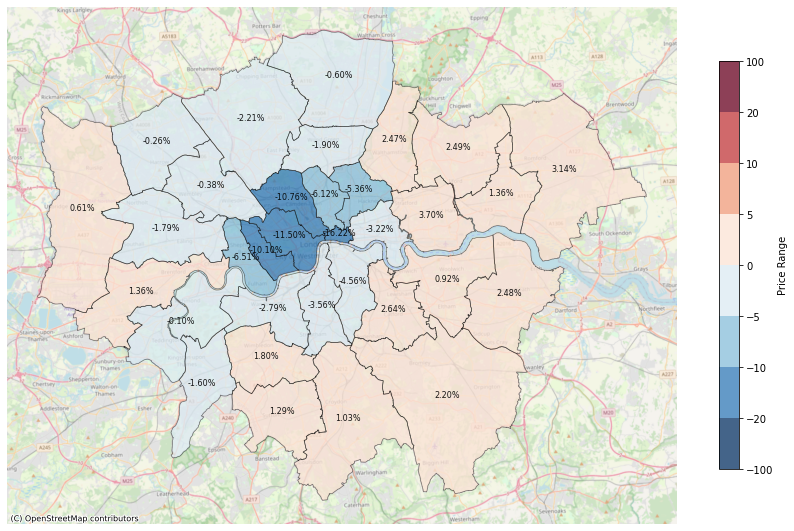

In [27]:

# Define the boundaries for the legend segments
legend_bins = [-100,-20, -10, -5,0, 5, 10,20, 100]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='diff_pre_during', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['diff_pre_during']
    ax.annotate(text=f"{price:.2f}%", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map6.png', dpi=300, bbox_inches='tight')

plt.show()


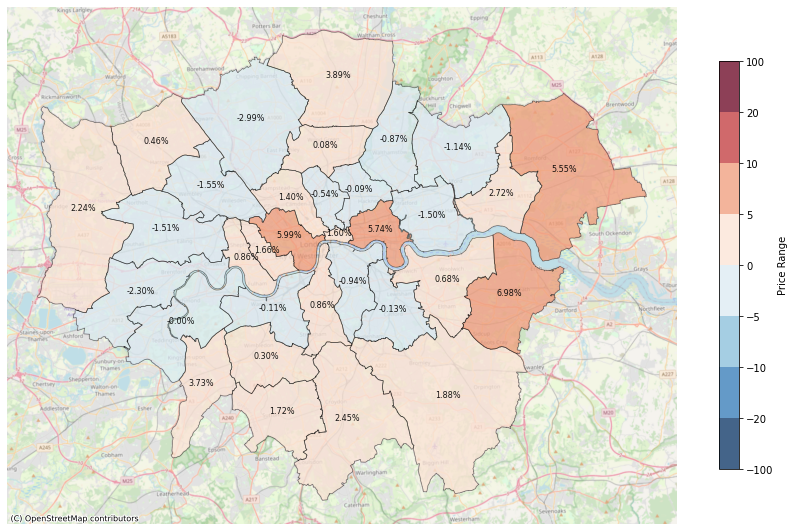

In [28]:

# Define the boundaries for the legend segments
legend_bins = [-100,-20, -10, -5,0, 5, 10,20, 100]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='diff_during_post1', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

for idx, row in price_join.iterrows():
    price = row['diff_during_post1']
    ax.annotate(text=f"{price:.2f}%", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.9)  # Rounded to 2 decimal places


# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map7.png', dpi=300, bbox_inches='tight')

plt.show()


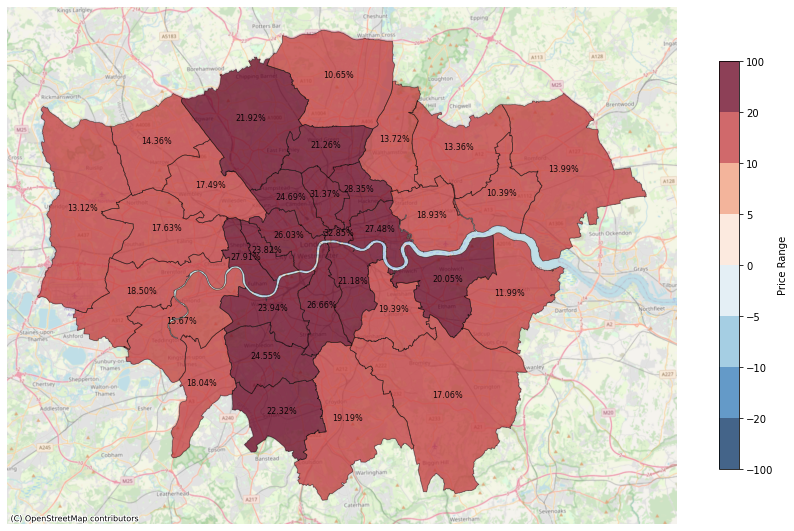

In [10]:

# Define the boundaries for the legend segments
legend_bins = [-100,-20, -10, -5,0, 5, 10,20, 100]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='diff_post1_post2', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['diff_post1_post2']
    ax.annotate(text=f"{price:.2f}%", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('price_map8.png', dpi=300, bbox_inches='tight')

plt.show()

#### lsoa

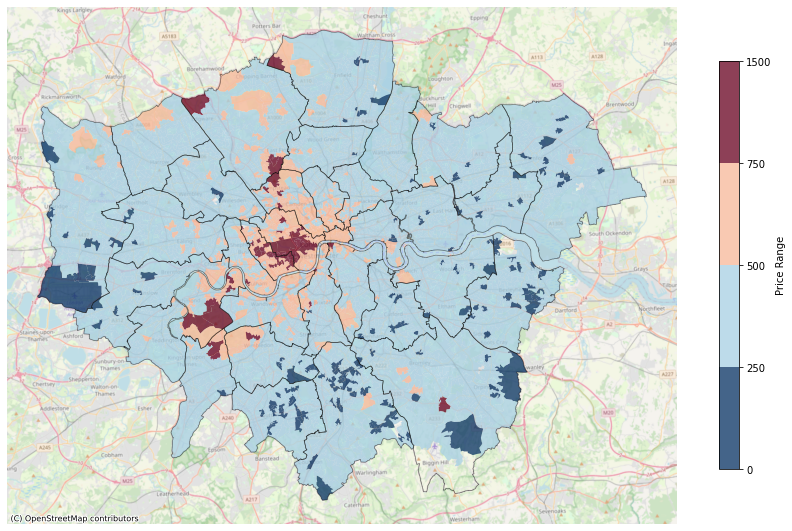

In [30]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='pre_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('lsoa_map1.png', dpi=300, bbox_inches='tight')

plt.show()


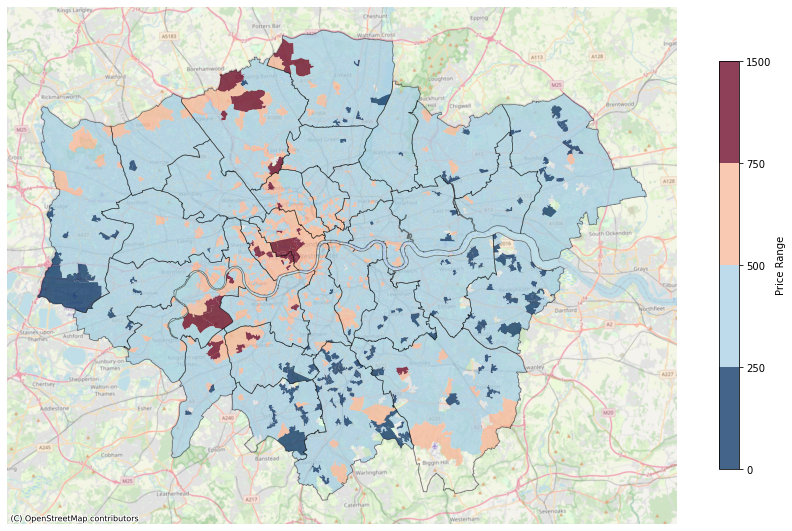

In [31]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='during_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('lsoa_map2.png', dpi=300, bbox_inches='tight')

plt.show()


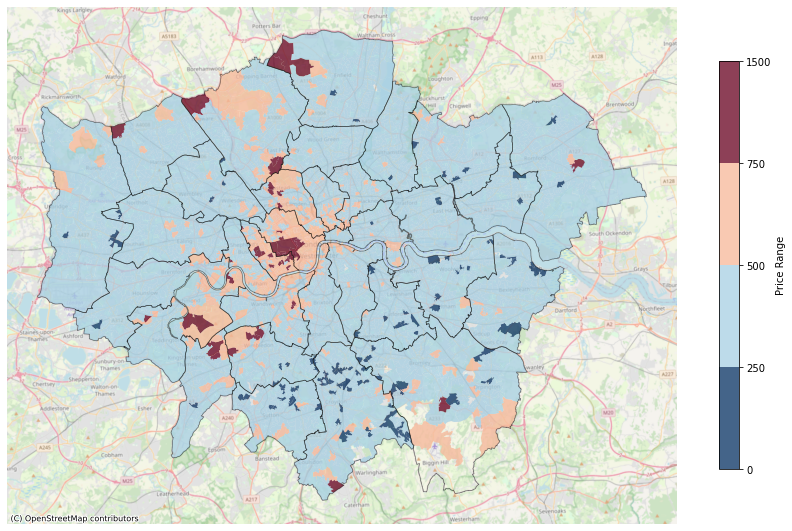

In [32]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='post1_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('lsoa_map3.png', dpi=300, bbox_inches='tight')

plt.show()


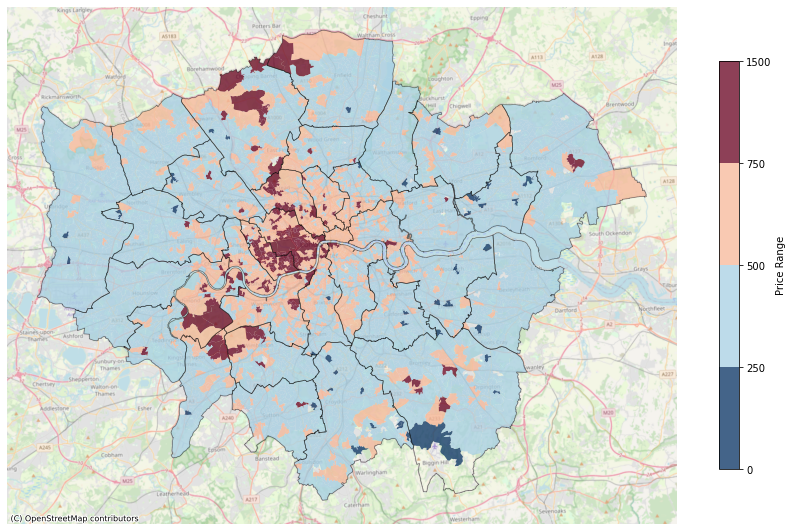

In [33]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='post2_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=0.7)

ax.set_axis_off()

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.savefig('lsoa_map4.png', dpi=300, bbox_inches='tight')

plt.show()


## text extract

In [129]:
Zoopla_7=zoopla_join.copy()

In [130]:
Zoopla_7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829401 entries, 0 to 829400
Data columns (total 21 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   property_id     829401 non-null  int64         
 1   price_last      829401 non-null  int64         
 2   property_type   829401 non-null  object        
 3   num_bed_last    829401 non-null  int64         
 4   num_bath_max    829401 non-null  int64         
 5   description     829401 non-null  object        
 6   start_date_new  829401 non-null  object        
 7   duration_1      829401 non-null  int64         
 8   lnprice         829401 non-null  float64       
 9   end_date_new    829401 non-null  object        
 10  pre             829401 non-null  int64         
 11  during          829401 non-null  int64         
 12  post            829401 non-null  int64         
 13  post1           829401 non-null  int64         
 14  post2           829401 non-null  int

In [131]:
Zoopla_7['description_lower']=Zoopla_7['description'].str.lower()

In [132]:
Zoopla_7['bluesp']=Zoopla_7['description_lower'].str.contains(r'reiverside|thames|river|water',regex=True).astype(int)
Zoopla_7.head()
Zoopla_7['bluesp'].sum()

135425

In [133]:
Zoopla_7['greensp']=0
Zoopla_7['greensp']=Zoopla_7['description_lower'].str.contains(r'\bpark\b|greenspace',regex=True).astype(int)
Zoopla_7.head()
Zoopla_7['greensp'].sum()

181297

In [134]:
Zoopla_7['station']=0
station = ['station','juction','transprot','underground','undergrounds','bus','buses']
Zoopla_7['station']=Zoopla_7['description_lower'].str.contains('|'.join(station)).astype(int)
Zoopla_7.head()
Zoopla_7['station'].sum()

543191

In [135]:
Zoopla_7['school']=0
school = ['school','university','college','campus']
Zoopla_7['school']=Zoopla_7['description_lower'].str.contains('|'.join(school)).astype(int)

Zoopla_7.head()

Zoopla_7['school'].sum()

76548

In [136]:
Zoopla_7['shop']=0
shop= ['supermarket','supermarkets','shops','shop','markets','market','high street','amenit']
Zoopla_7['shop']=Zoopla_7['description_lower'].str.contains('|'.join(shop)).astype(int)
Zoopla_7.head()
Zoopla_7['shop'].sum()

481905

In [137]:
Zoopla_7['restaurant']=0
restaurant= ['restaurant','cafe','pubs','bars']
Zoopla_7['restaurant']=Zoopla_7['description_lower'].str.contains('|'.join(restaurant)).astype(int)
Zoopla_7.head()
Zoopla_7['restaurant'].sum()

218181

In [138]:
Zoopla_7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829401 entries, 0 to 829400
Data columns (total 28 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   property_id        829401 non-null  int64         
 1   price_last         829401 non-null  int64         
 2   property_type      829401 non-null  object        
 3   num_bed_last       829401 non-null  int64         
 4   num_bath_max       829401 non-null  int64         
 5   description        829401 non-null  object        
 6   start_date_new     829401 non-null  object        
 7   duration_1         829401 non-null  int64         
 8   lnprice            829401 non-null  float64       
 9   end_date_new       829401 non-null  object        
 10  pre                829401 non-null  int64         
 11  during             829401 non-null  int64         
 12  post               829401 non-null  int64         
 13  post1              829401 non-null  int64   

In [139]:
Zoopla_7.head()

,property_id,price_last,property_type,num_bed_last,num_bath_max,description,start_date_new,duration_1,lnprice,end_date_new,...,LAD11NM,inner_London,edate,description_lower,bluesp,greensp,station,school,shop,restaurant
0,281626,462,Terraced house,3,0,Spacious 3 bedroom house with contemporary des...,2019-10-16,6,6.135565,2019-10-22,...,Newham,1,2019-10-22,spacious 3 bedroom house with contemporary des...,0,1,1,0,1,1
1,578819,945,Flat,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-06,13,6.851185,2021-02-19,...,City of London,1,2021-02-19,stunning and spacious 2 bedroom luxury apartme...,1,0,1,0,0,0
2,578819,945,Flat,2,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-13,6,6.851185,2021-02-19,...,City of London,1,2021-02-19,stunning and spacious 2 bedroom luxury apartme...,1,0,1,0,0,0
3,652324,185,Studio,0,1,A brand new first floor Studio flat with easy ...,2019-01-08,85,5.220356,2019-04-03,...,Barnet,0,2019-04-03,a brand new first floor studio flat with easy ...,0,0,0,0,0,0
4,652324,185,Studio,0,1,A brand new first floor studio apartment situa...,2019-03-14,18,5.220356,2019-04-01,...,Barnet,0,2019-04-01,a brand new first floor studio apartment situa...,0,0,1,0,1,0


In [140]:
Zoopla_text=Zoopla_7.drop(columns=['description_lower','description'])

In [178]:
Zoopla_text.to_csv('Zoopla_text0822.csv')

In [141]:
Zoopla_8=pd.read_csv('Zoopla_text0822.csv')

In [142]:
Zoopla_8['filter'] = Zoopla_8['bluesp']+Zoopla_8['station']+Zoopla_8['greensp']+Zoopla_8['school']+Zoopla_8['shop']+Zoopla_8['restaurant']

In [143]:
Zoopla_text2=Zoopla_8[Zoopla_8['filter']!= 0]

In [144]:
Zoopla_text2=Zoopla_text2.drop(columns='Unnamed: 0')

In [145]:
Zoopla_text2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 713050 entries, 0 to 829400
Data columns (total 27 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   property_id     713050 non-null  int64  
 1   price_last      713050 non-null  int64  
 2   property_type   713050 non-null  object 
 3   num_bed_last    713050 non-null  int64  
 4   num_bath_max    713050 non-null  int64  
 5   start_date_new  713050 non-null  object 
 6   duration_1      713050 non-null  int64  
 7   lnprice         713050 non-null  float64
 8   end_date_new    713050 non-null  object 
 9   pre             713050 non-null  int64  
 10  during          713050 non-null  int64  
 11  post            713050 non-null  int64  
 12  post1           713050 non-null  int64  
 13  post2           713050 non-null  int64  
 14  LSOA11CD        713050 non-null  object 
 15  LSOA11NM        713050 non-null  object 
 16  LAD11CD         713050 non-null  object 
 17  LAD11NM   

In [184]:
Zoopla_text2.to_csv('Zoopla_text0822_2_cleaned.csv')

In [161]:
Zoopla_text2= pd.read_csv('Zoopla_text0822_2_cleaned.csv')

In [162]:
Zoopla_text2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 713050 entries, 0 to 713049
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      713050 non-null  int64  
 1   property_id     713050 non-null  int64  
 2   price_last      713050 non-null  int64  
 3   property_type   713050 non-null  object 
 4   num_bed_last    713050 non-null  int64  
 5   num_bath_max    713050 non-null  int64  
 6   start_date_new  713050 non-null  object 
 7   duration_1      713050 non-null  int64  
 8   lnprice         713050 non-null  float64
 9   end_date_new    713050 non-null  object 
 10  pre             713050 non-null  int64  
 11  during          713050 non-null  int64  
 12  post            713050 non-null  int64  
 13  post1           713050 non-null  int64  
 14  post2           713050 non-null  int64  
 15  LSOA11CD        713050 non-null  object 
 16  LSOA11NM        713050 non-null  object 
 17  LAD11CD   

In [163]:
type_count=Zoopla_text2.groupby('property_type').property_id.agg(Count='count').reset_index()
type_count=type_count.sort_values(by='Count',ascending=False).reset_index()
type_count

,index,property_type,Count
0,14,Flat,503681
1,31,Studio,72787
2,33,Terraced house,54152
3,30,Semi-detached house,27887
4,20,Maisonette,24180
5,9,Detached house,10143
6,10,End terrace house,9741
7,34,Town house,4232
8,21,Mews house,1981
9,2,Bungalow,1322


In [164]:
Zoopla_top_type=Zoopla_text2[(Zoopla_text2['property_type'] == 'Flat')|(Zoopla_text2['property_type'] == 'Studio')|
                            (Zoopla_text2['property_type'] == 'Terraced house')|
                (Zoopla_text2['property_type'] == 'Semi-detached house')|(Zoopla_text2['property_type'] == 'Maisonette')|(
                    Zoopla_text2['property_type'] == 'Detached house')|(Zoopla_text2['property_type'] == 'End terrace house')]

In [165]:
type_count=Zoopla_top_type.groupby('property_type').property_id.agg(Count='count').reset_index()
type_count=type_count.sort_values(by='Count',ascending=False).reset_index()
type_count

,index,property_type,Count
0,2,Flat,503681
1,5,Studio,72787
2,6,Terraced house,54152
3,4,Semi-detached house,27887
4,3,Maisonette,24180
5,0,Detached house,10143
6,1,End terrace house,9741


In [166]:
Zoopla_top_type['covid_stage'] = Zoopla_top_type.apply( lambda row: row['pre']+2*row['during']+3*row['post1']+ 4*row['post2'],axis=1)

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15228\3546770698.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Zoopla_top_type['covid_stage'] = Zoopla_top_type.apply( lambda row: row['pre']+2*row['during']+3*row['post1']+ 4*row['post2'],axis=1)


In [167]:
print(f"Zoopla has {Zoopla_top_type.shape[0]:,.0f} rows.")

print(f"The range of price is {Zoopla_top_type.price_last.min():,.2f} to {Zoopla_top_type.price_last.max():,.2f}")
print(f"The range of bedroom numer is {Zoopla_top_type.num_bed_last.min():,.2f} to {Zoopla_top_type.num_bed_last.max():,.2f}")
print(f"The range of bathroom numer is {Zoopla_top_type.num_bath_max.min():,.2f} to {Zoopla_top_type.num_bath_max.max():,.2f}")

Zoopla has 702,571 rows.
The range of price is 98.00 to 1,606.00
The range of bedroom numer is 0.00 to 255.00
The range of bathroom numer is 0.00 to 186.00


In [168]:
bathroom_num_count=Zoopla_top_type.groupby('num_bath_max').property_id.agg(Count='count').reset_index()

bathroom_num_count

,num_bath_max,Count
0,0,68280
1,1,460448
2,2,153002
3,3,17331
4,4,2581
5,5,614
6,6,166
7,7,86
8,8,12
9,9,20


In [169]:
bedroom_num_count=Zoopla_top_type.groupby('num_bed_last').property_id.agg(Count='count').reset_index()

bedroom_num_count

,num_bed_last,Count
0,0,67719
1,1,219676
2,2,248449
3,3,109230
4,4,41903
5,5,12206
6,6,2762
7,7,437
8,8,129
9,9,31


In [170]:
Zoopla_text3 = Zoopla_top_type[ Zoopla_top_type['num_bed_last'] <= 6]

In [171]:
Zoopla_text3 = Zoopla_text3[ Zoopla_text3['num_bath_max'] <= 4]

In [172]:
print(f"Zoopla has {Zoopla_text3.shape[0]:,.0f} rows.")

print(f"The range of price is {Zoopla_text3.price_last.min():,.2f} to {Zoopla_text3.price_last.max():,.2f}")
print(f"The range of bedroom numer is {Zoopla_text3.num_bed_last.min():,.2f} to {Zoopla_text3.num_bed_last.max():,.2f}")
print(f"The range of bathroom numer is {Zoopla_text3.num_bath_max.min():,.2f} to {Zoopla_text3.num_bath_max.max():,.2f}")

Zoopla has 701,126 rows.
The range of price is 98.00 to 1,606.00
The range of bedroom numer is 0.00 to 6.00
The range of bathroom numer is 0.00 to 4.00


In [173]:
Zoopla_text3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 701126 entries, 0 to 713049
Data columns (total 29 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      701126 non-null  int64  
 1   property_id     701126 non-null  int64  
 2   price_last      701126 non-null  int64  
 3   property_type   701126 non-null  object 
 4   num_bed_last    701126 non-null  int64  
 5   num_bath_max    701126 non-null  int64  
 6   start_date_new  701126 non-null  object 
 7   duration_1      701126 non-null  int64  
 8   lnprice         701126 non-null  float64
 9   end_date_new    701126 non-null  object 
 10  pre             701126 non-null  int64  
 11  during          701126 non-null  int64  
 12  post            701126 non-null  int64  
 13  post1           701126 non-null  int64  
 14  post2           701126 non-null  int64  
 15  LSOA11CD        701126 non-null  object 
 16  LSOA11NM        701126 non-null  object 
 17  LAD11CD   

In [174]:
Zoopla_text3=Zoopla_text3.drop(columns=['Unnamed: 0'])

In [200]:
Zoopla_text3.to_csv('Zoopla_reg_0822.csv')

## analysis

In [175]:
Zoopla_text3 = pd.read_csv('Zoopla_reg_0822.csv')

In [176]:
Zoopla_text3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701126 entries, 0 to 701125
Data columns (total 29 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      701126 non-null  int64  
 1   property_id     701126 non-null  int64  
 2   price_last      701126 non-null  int64  
 3   property_type   701126 non-null  object 
 4   num_bed_last    701126 non-null  int64  
 5   num_bath_max    701126 non-null  int64  
 6   start_date_new  701126 non-null  object 
 7   duration_1      701126 non-null  int64  
 8   lnprice         701126 non-null  float64
 9   end_date_new    701126 non-null  object 
 10  pre             701126 non-null  int64  
 11  during          701126 non-null  int64  
 12  post            701126 non-null  int64  
 13  post1           701126 non-null  int64  
 14  post2           701126 non-null  int64  
 15  LSOA11CD        701126 non-null  object 
 16  LSOA11NM        701126 non-null  object 
 17  LAD11CD   

In [177]:
#Zoopla_reg=Zoopla_text3.drop(columns=['description_lower','description'])
Zoopla_reg = Zoopla_text3.copy()

In [178]:
Zoopla_reg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701126 entries, 0 to 701125
Data columns (total 29 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      701126 non-null  int64  
 1   property_id     701126 non-null  int64  
 2   price_last      701126 non-null  int64  
 3   property_type   701126 non-null  object 
 4   num_bed_last    701126 non-null  int64  
 5   num_bath_max    701126 non-null  int64  
 6   start_date_new  701126 non-null  object 
 7   duration_1      701126 non-null  int64  
 8   lnprice         701126 non-null  float64
 9   end_date_new    701126 non-null  object 
 10  pre             701126 non-null  int64  
 11  during          701126 non-null  int64  
 12  post            701126 non-null  int64  
 13  post1           701126 non-null  int64  
 14  post2           701126 non-null  int64  
 15  LSOA11CD        701126 non-null  object 
 16  LSOA11NM        701126 non-null  object 
 17  LAD11CD   

In [179]:
Zoopla_reg=Zoopla_reg.drop(columns= ['Unnamed: 0'])

### mlr

In [180]:
Zoopla_reg_dummy= pd.get_dummies(Zoopla_reg,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [181]:
X2=Zoopla_reg_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','post','duration_1',
                                 'pre','during','post1','post2','LSOA11NM','LAD11NM','filter','covid_stage','edate'])

In [182]:
X2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701126 entries, 0 to 701125
Data columns (total 59 columns):
 #   Column                             Non-Null Count   Dtype
---  ------                             --------------   -----
 0   inner_London                       701126 non-null  int64
 1   bluesp                             701126 non-null  int64
 2   greensp                            701126 non-null  int64
 3   station                            701126 non-null  int64
 4   school                             701126 non-null  int64
 5   shop                               701126 non-null  int64
 6   restaurant                         701126 non-null  int64
 7   num_bed_last_0                     701126 non-null  uint8
 8   num_bed_last_1                     701126 non-null  uint8
 9   num_bed_last_2                     701126 non-null  uint8
 10  num_bed_last_3                     701126 non-null  uint8
 11  num_bed_last_4                     701126 non-null  uint8
 12  nu

In [214]:
X=Zoopla_reg.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LAD11CD','LSOA11CD','post','duration_1',
                                 'pre','during','post1','post2','LSOA11NM','LAD11NM','filter','covid_stage','duration_1','edate','property_type'])

In [215]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701126 entries, 0 to 701125
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype
---  ------        --------------   -----
 0   num_bed_last  701126 non-null  int64
 1   num_bath_max  701126 non-null  int64
 2   inner_London  701126 non-null  int64
 3   bluesp        701126 non-null  int64
 4   greensp       701126 non-null  int64
 5   station       701126 non-null  int64
 6   school        701126 non-null  int64
 7   shop          701126 non-null  int64
 8   restaurant    701126 non-null  int64
dtypes: int64(9)
memory usage: 48.1 MB


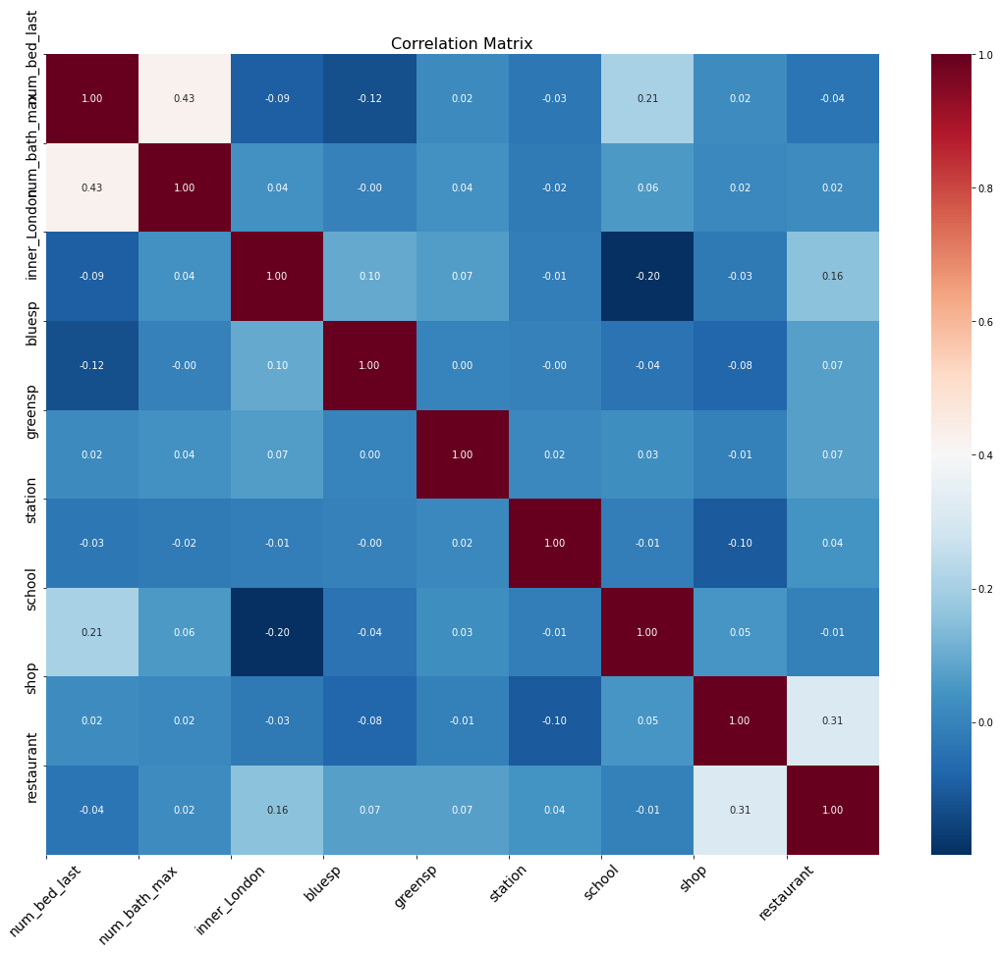

In [216]:
import seaborn as sns


df = X

plt.rcParams["axes.grid"] = False
plt.figure(figsize=(19, 15))

# 计算相关性矩阵
corr_matrix = df.corr()

# 使用Seaborn绘制红蓝配色的相关性矩阵
sns.heatmap(corr_matrix, cmap='RdBu_r', annot=True, fmt=".2f")

plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14, rotation=45)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14)
plt.title('Correlation Matrix', fontsize=16)

plt.savefig('Correlation Matrix.png', dpi=300, bbox_inches='tight')
plt.show()


#### london

In [186]:
X2_drop=X2.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London'])
#,'inner_London','num_bed_last_2','num_bath_max_1','property_type_Studio','LAD11CD_E09000016','property_type_Flat','Unnamed: 0.1','Unnamed: 0','school'

In [187]:
X_mlr_london=X2_drop.columns.tolist()
#X_mlr_london=X2_drop_vif.columns.tolist()

In [188]:
X_mlr_london

['bluesp',
 'greensp',
 'station',
 'school',
 'shop',
 'restaurant',
 'num_bed_last_0',
 'num_bed_last_1',
 'num_bed_last_2',
 'num_bed_last_3',
 'num_bed_last_4',
 'num_bed_last_5',
 'num_bath_max_0',
 'num_bath_max_1',
 'num_bath_max_2',
 'num_bath_max_3',
 'property_type_Detached house',
 'property_type_Flat',
 'property_type_Maisonette',
 'property_type_Semi-detached house',
 'property_type_Studio',
 'property_type_Terraced house',
 'LAD11CD_E09000001',
 'LAD11CD_E09000002',
 'LAD11CD_E09000003',
 'LAD11CD_E09000004',
 'LAD11CD_E09000005',
 'LAD11CD_E09000006',
 'LAD11CD_E09000007',
 'LAD11CD_E09000008',
 'LAD11CD_E09000009',
 'LAD11CD_E09000010',
 'LAD11CD_E09000011',
 'LAD11CD_E09000012',
 'LAD11CD_E09000013',
 'LAD11CD_E09000014',
 'LAD11CD_E09000015',
 'LAD11CD_E09000016',
 'LAD11CD_E09000017',
 'LAD11CD_E09000018',
 'LAD11CD_E09000019',
 'LAD11CD_E09000020',
 'LAD11CD_E09000021',
 'LAD11CD_E09000022',
 'LAD11CD_E09000023',
 'LAD11CD_E09000024',
 'LAD11CD_E09000025',
 'LAD11CD

In [189]:
Zoopla_reg_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701126 entries, 0 to 701125
Data columns (total 76 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   property_id                        701126 non-null  int64  
 1   price_last                         701126 non-null  int64  
 2   start_date_new                     701126 non-null  object 
 3   duration_1                         701126 non-null  int64  
 4   lnprice                            701126 non-null  float64
 5   end_date_new                       701126 non-null  object 
 6   pre                                701126 non-null  int64  
 7   during                             701126 non-null  int64  
 8   post                               701126 non-null  int64  
 9   post1                              701126 non-null  int64  
 10  post2                              701126 non-null  int64  
 11  LSOA11CD                           7011

In [190]:
models = []
names = []

for covid_stage in range(1, 5):
    stage = Zoopla_reg_dummy[Zoopla_reg_dummy['covid_stage'] == covid_stage]
    X = stage[X_mlr_london]  # Select the X variables from the DataFrame  
    y = stage['price_last']
    model = sm.OLS(y, X).fit()
    models.append(model)
    names.append(f'covid_stage {covid_stage}')

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)


                                  covid_stage 1 covid_stage 2 covid_stage 3 covid_stage 4
-----------------------------------------------------------------------------------------
bluesp                            -2.896***     -8.039***     10.174***     20.681***    
                                  (0.846)       (0.883)       (0.895)       (1.399)      
greensp                           11.046***     15.304***     16.075***     21.978***    
                                  (0.736)       (0.782)       (0.785)       (1.236)      
station                           -4.642***     -3.971***     -0.755        -3.568***    
                                  (0.742)       (0.795)       (0.789)       (1.245)      
school                            -15.229***    -3.445***     -3.318***     -8.708***    
                                  (1.045)       (1.208)       (1.165)       (1.777)      
shop                              -5.516***     -8.141***     -2.839***     -1.626       
         

#### inner london

In [191]:
Zoopla_reg_inner = Zoopla_reg[Zoopla_reg['inner_London']==1]

In [192]:
Zoopla_reg_inner_dummy= pd.get_dummies(Zoopla_reg_inner,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [193]:
Zoopla_reg_inner_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 427782 entries, 0 to 701125
Data columns (total 57 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   property_id                        427782 non-null  int64  
 1   price_last                         427782 non-null  int64  
 2   start_date_new                     427782 non-null  object 
 3   duration_1                         427782 non-null  int64  
 4   lnprice                            427782 non-null  float64
 5   end_date_new                       427782 non-null  object 
 6   pre                                427782 non-null  int64  
 7   during                             427782 non-null  int64  
 8   post                               427782 non-null  int64  
 9   post1                              427782 non-null  int64  
 10  post2                              427782 non-null  int64  
 11  LSOA11CD                           4277

In [194]:
X_inner=Zoopla_reg_inner_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','post','duration_1',
                                 'pre','during','post1','post2', 'LSOA11NM','LAD11NM','filter','covid_stage','edate',
                                             'LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London'])
#

In [195]:
X_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 427782 entries, 0 to 701125
Data columns (total 35 columns):
 #   Column                             Non-Null Count   Dtype
---  ------                             --------------   -----
 0   bluesp                             427782 non-null  int64
 1   greensp                            427782 non-null  int64
 2   station                            427782 non-null  int64
 3   school                             427782 non-null  int64
 4   shop                               427782 non-null  int64
 5   restaurant                         427782 non-null  int64
 6   num_bed_last_0                     427782 non-null  uint8
 7   num_bed_last_1                     427782 non-null  uint8
 8   num_bed_last_2                     427782 non-null  uint8
 9   num_bed_last_3                     427782 non-null  uint8
 10  num_bed_last_4                     427782 non-null  uint8
 11  num_bed_last_5                     427782 non-null  uint8
 12  nu

In [196]:
X_mlr_inner_london=X_inner.columns.tolist()

In [197]:
models = []
names = []

for covid_stage in range(1, 5):
    stage = Zoopla_reg_inner_dummy[Zoopla_reg_inner_dummy['covid_stage'] == covid_stage]
    X = stage[X_mlr_inner_london]  # Select the X variables from the DataFrame  
    y = stage['price_last']
    model = sm.OLS(y, X).fit()
    models.append(model)
    names.append(f'covid_stage {covid_stage}')

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)


                                  covid_stage 1 covid_stage 2 covid_stage 3 covid_stage 4
-----------------------------------------------------------------------------------------
bluesp                            -10.480***    -14.450***    9.738***      20.955***    
                                  (1.173)       (1.123)       (1.213)       (1.895)      
greensp                           4.099***      11.465***     13.514***     16.413***    
                                  (1.065)       (1.034)       (1.096)       (1.737)      
station                           -11.551***    -9.765***     -3.240***     -9.613***    
                                  (1.094)       (1.065)       (1.129)       (1.789)      
school                            -18.362***    1.827         2.820         1.829        
                                  (1.992)       (2.015)       (2.139)       (3.317)      
shop                              -11.818***    -12.983***    -6.154***     -5.690***    
         

#### outer london

In [198]:
Zoopla_reg_outer = Zoopla_reg[Zoopla_reg['inner_London']==0]

In [199]:
Zoopla_reg_outer_dummy= pd.get_dummies(Zoopla_reg_outer,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [200]:
Zoopla_reg_outer_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 273344 entries, 3 to 701123
Data columns (total 62 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   property_id                        273344 non-null  int64  
 1   price_last                         273344 non-null  int64  
 2   start_date_new                     273344 non-null  object 
 3   duration_1                         273344 non-null  int64  
 4   lnprice                            273344 non-null  float64
 5   end_date_new                       273344 non-null  object 
 6   pre                                273344 non-null  int64  
 7   during                             273344 non-null  int64  
 8   post                               273344 non-null  int64  
 9   post1                              273344 non-null  int64  
 10  post2                              273344 non-null  int64  
 11  LSOA11CD                           2733

In [201]:
X_outer=Zoopla_reg_outer_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','post','duration_1',
                                 'pre','during','post1','post2', 'LSOA11NM','LAD11NM','filter','covid_stage','edate',
                                             'LAD11CD_E09000031','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London'])
#

In [202]:
X_mlr_outer_london=X_outer.columns.tolist()

In [203]:
models = []
names = []

for covid_stage in range(1, 5):
    stage = Zoopla_reg_outer_dummy[Zoopla_reg_outer_dummy['covid_stage'] == covid_stage]
    X = stage[X_mlr_outer_london]  # Select the X variables from the DataFrame  
    y = stage['price_last']
    model = sm.OLS(y, X).fit()
    models.append(model)
    names.append(f'covid_stage {covid_stage}')

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)



                                  covid_stage 1 covid_stage 2 covid_stage 3 covid_stage 4
-----------------------------------------------------------------------------------------
bluesp                            11.979***     9.292***      10.498***     15.415***    
                                  (0.972)       (1.181)       (1.040)       (1.677)      
greensp                           17.991***     18.931***     17.976***     27.387***    
                                  (0.782)       (0.949)       (0.859)       (1.390)      
station                           4.517***      5.676***      1.954**       2.713**      
                                  (0.764)       (0.934)       (0.827)       (1.349)      
school                            -6.516***     -2.848***     -2.400**      -5.871***    
                                  (0.860)       (1.085)       (0.956)       (1.532)      
shop                              -1.356*       -2.339***     -2.037**      -1.913       
         

### discontinuous regression

In [217]:
Zoopla_reg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701126 entries, 0 to 701125
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   property_id     701126 non-null  int64  
 1   price_last      701126 non-null  int64  
 2   property_type   701126 non-null  object 
 3   num_bed_last    701126 non-null  int64  
 4   num_bath_max    701126 non-null  int64  
 5   start_date_new  701126 non-null  object 
 6   duration_1      701126 non-null  int64  
 7   lnprice         701126 non-null  float64
 8   end_date_new    701126 non-null  object 
 9   pre             701126 non-null  int64  
 10  during          701126 non-null  int64  
 11  post            701126 non-null  int64  
 12  post1           701126 non-null  int64  
 13  post2           701126 non-null  int64  
 14  LSOA11CD        701126 non-null  object 
 15  LSOA11NM        701126 non-null  object 
 16  LAD11CD         701126 non-null  object 
 17  LAD11NM   

#### London

In [218]:
pre = Zoopla_reg[Zoopla_reg['pre']==1]
during = Zoopla_reg[Zoopla_reg['during']==1]
#during1 = Zoopla_reg[Zoopla_reg['during1']==1]
#during2 = Zoopla_reg[Zoopla_reg['during2']==1]
post = Zoopla_reg[Zoopla_reg['post']==1]
post1 =  Zoopla_reg[Zoopla_reg['post1']==1]
post2 = Zoopla_reg[Zoopla_reg['post2']==1]


In [219]:
pre_during = pd.concat([pre,during])
during_post1 = pd.concat([during,post1])
post1_post2 = pd.concat([post1,post2])

In [220]:
interact_col = ['bluesp','greensp','inner_London','station','school','shop','restaurant']

for col in interact_col:
    pre_during[f'{col}_1'] = pre_during['during'] *pre_during[col]
    during_post1[f'{col}_1'] = during_post1['post1'] *during_post1[col]
    post1_post2[f'{col}_1'] =post1_post2['post2'] *post1_post2[col]

In [221]:
pre_during_dummy= pd.get_dummies(pre_during,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
during_post1_dummy= pd.get_dummies(during_post1,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
post1_post2_dummy= pd.get_dummies(post1_post2,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])


In [222]:
X_pre_during=pre_during.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','property_type','LAD11CD',
                                 'pre','post1','post','post2','LSOA11NM','LAD11NM','filter','covid_stage','duration_1','edate'])

In [223]:
X_pre_during2=pre_during_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','post1','post','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',
X_during_post1=during_post1_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','post','during','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',
X_post1_post2=post1_post2_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','during','post','post1','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',

In [224]:
X_pre_during2_1=X_pre_during2.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'
                                            ])
                                            #'restaurant_1','shop_1','school_1','station_1''LAD11CD_E09000002','LAD11CD_E09000001','num_bath_max_4','property_type_End terrace house','num_bed_last_0','inner_London',
                                          # 'num_bath_max_1','property_type_Flat','LAD11CD_E09000033','num_bed_last_2',
X_during_post1_1=X_during_post1.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_post1_post2_1=X_post1_post2.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])                                          

In [225]:
model_pre_during = sm.OLS(pre_during_dummy['price_last'],X_pre_during2_1).fit()
model_during_post1 = sm.OLS(during_post1_dummy['price_last'],X_during_post1_1).fit()
model_post1_post2 = sm.OLS(post1_post2_dummy['price_last'],X_post1_post2_1).fit()

#### outer & inner

In [226]:
pre_during_outer =pre_during[pre_during['inner_London' ]==0]
pre_during_inner =pre_during[pre_during['inner_London' ]==1]

In [227]:
during_post1_outer =during_post1[during_post1['inner_London' ]==0]
during_post1_inner =during_post1[during_post1['inner_London' ]==1]

In [228]:
post1_post2_outer =post1_post2[post1_post2['inner_London' ]==0]
post1_post2_inner =post1_post2[post1_post2['inner_London' ]==1]

In [229]:
pre_during_outer_dummy= pd.get_dummies(pre_during_outer ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
during_post1_outer_dummy= pd.get_dummies(during_post1_outer ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
post1_post2_outer_dummy= pd.get_dummies(post1_post2_outer ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])


In [230]:
pre_during_inner_dummy= pd.get_dummies(pre_during_inner ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
during_post1_inner_dummy= pd.get_dummies(during_post1_inner ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
post1_post2_inner_dummy= pd.get_dummies(post1_post2_inner ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [231]:
X_pre_during_dummy_outer=pre_during_outer_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post1','post','post2','LSOA11NM',
                                                              'LAD11NM','filter','duration_1','edate','LAD11CD_E09000031','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_pre_during_dummy_inner=pre_during_inner_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post1','post','post2','LSOA11NM',
                                                              'LAD11NM','filter','duration_1','edate','LAD11CD_E09000033','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])

In [232]:
X_during_post1_outer_dummy=during_post1_outer_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post',
                                                              'during','post2','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000031','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_during_post1_inner_dummy=during_post1_inner_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post',
                                                              'during','post2','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000033','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])

In [233]:
X_post1_post2_outer_dummy=post1_post2_outer_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post',
                                                              'during','post1','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000031','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_post1_post2_inner_dummy=post1_post2_inner_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post',
                                                              'during','post1','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000033','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])

In [234]:
model_pre_during_outer = sm.OLS(pre_during_outer_dummy['price_last'],X_pre_during_dummy_outer).fit()
model_pre_during_inner = sm.OLS(pre_during_inner_dummy['price_last'],X_pre_during_dummy_inner).fit()

In [235]:
model_during_post1_outer = sm.OLS(during_post1_outer_dummy['price_last'],X_during_post1_outer_dummy).fit()
model_during_post1_inner = sm.OLS(during_post1_inner_dummy['price_last'],X_during_post1_inner_dummy).fit()

In [236]:
model_post1_post2_outer = sm.OLS(post1_post2_outer_dummy['price_last'],X_post1_post2_outer_dummy).fit()
model_post1_post2_inner = sm.OLS(post1_post2_inner_dummy['price_last'],X_post1_post2_inner_dummy).fit()

#### results

In [237]:
pre_during_results = summary_col(
    [model_pre_during_outer, model_pre_during_inner, model_pre_during],
    stars=True,
    float_format='%0.3f',
    model_names=['Outer London', 'Inner London', 'London'],
    info_dict={'R-squared': lambda x: "{:.2f}".format(x.rsquared)}
)
print(pre_during_results)


                                  Outer London Inner London    London  
-----------------------------------------------------------------------
LAD11CD_E09000001                              -9.239**     -6.465*    
                                               (4.102)      (3.668)    
LAD11CD_E09000002                 12.141***                 -283.824***
                                  (1.982)                   (2.657)    
LAD11CD_E09000003                 79.911***                 -220.020***
                                  (1.303)                   (1.342)    
LAD11CD_E09000004                 -16.251***                -311.330***
                                  (2.137)                   (2.910)    
LAD11CD_E09000005                 78.674***                 -215.870***
                                  (1.349)                   (1.428)    
LAD11CD_E09000006                 18.911***                 -276.842***
                                  (1.679)                   (2.

In [238]:
during_post1_results = summary_col(
    [model_during_post1, model_during_post1_inner, model_during_post1_outer],
    stars=True,
    float_format='%0.3f',
    model_names=['London', 'Inner London','Outer London'],
    info_dict={'R-squared': lambda x: "{:.2f}".format(x.rsquared)}
)
print(during_post1_results)


                                     London   Inner London Outer London
-----------------------------------------------------------------------
LAD11CD_E09000001                 -21.927***  -24.070***               
                                  (3.449)     (3.845)                  
LAD11CD_E09000002                 -261.427***              12.668***   
                                  (2.977)                  (2.189)     
LAD11CD_E09000003                 -201.358***              76.015***   
                                  (1.416)                  (1.385)     
LAD11CD_E09000004                 -274.734***              -2.044      
                                  (3.143)                  (2.295)     
LAD11CD_E09000005                 -201.783***              71.834***   
                                  (1.473)                  (1.416)     
LAD11CD_E09000006                 -246.013***              27.731***   
                                  (2.255)                  (1.7

In [239]:
post1_post2_results = summary_col(
    [model_post1_post2, model_post1_post2_inner, model_post1_post2_outer],
    stars=True,
    float_format='%0.3f',
    model_names=[ 'London', 'Inner London','Outer London'],
    info_dict={'R-squared': lambda x: "{:.2f}".format(x.rsquared)}
)
print(post1_post2_results)


                                     London   Inner London Outer London
-----------------------------------------------------------------------
LAD11CD_E09000001                 -20.694***  -24.187***               
                                  (4.303)     (4.809)                  
LAD11CD_E09000002                 -310.201***              18.306***   
                                  (3.458)                  (2.607)     
LAD11CD_E09000003                 -243.612***              89.878***   
                                  (1.705)                  (1.711)     
LAD11CD_E09000004                 -321.082***              8.096***    
                                  (3.294)                  (2.524)     
LAD11CD_E09000005                 -238.599***              88.054***   
                                  (1.811)                  (1.764)     
LAD11CD_E09000006                 -292.960***              38.163***   
                                  (2.546)                  (2.1